- 1. [x] Inception-Resnet-v2
- 2. [x] Resnet26
- 3. [x] Resnet18
- 4. [x] Resnet10
- 5. [x] SFCN
- 6. [x] SE-SFCN
- 7. [x] V-Net Encoder layer-4
- 8. [x] V-Net Encoder layer-3
- 9. [x] V-Net Encoder layer-2
- 10. [x] V-Net Encoder layer-1
- 11. [ ] Best(1~10) + SE Block
- 12. [ ] Best(1~11) + LDS
- 13. [ ] Best(1~11) + FDS
- 14. [ ] Best(1~11) + LDS + FDS
- 15. [ ] Best(1~11) + Ranking Loss

In [52]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]= "0,1"

In [53]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
from tqdm import tqdm
import numpy as np
import torchio as tio
from torch.utils.data import Dataset, DataLoader
from collections import Counter
from scipy.ndimage import zoom, convolve1d
from models.lds_utils import get_lds_kernel_window
from models.loss import weighted_mse_loss
import gc
import types
import random
import torch
from torch import nn
import torch.optim as optim
import torch.backends.cudnn as cudnn
from sklearn.model_selection import train_test_split
from scipy.stats import pearsonr, spearmanr
import wandb

In [3]:
# models
from models.inception_resnet_v2 import inception_resnet_v2
from models.resnet import resnet26, resnet
from models.sfcn import SFCN
from models.vnet_encoder_reg import Regressor
from models.se_block import SEBlock

In [4]:
## model import test
net1 = inception_resnet_v2(in_channels=1, num_classes=1)
net2 = resnet26(in_channels=1, num_classes=1)
net3 = resnet(model_depth=18, in_channels=1, num_classes=1)
net4 = resnet(model_depth=10, in_channels=1, num_classes=1)
net5 = SFCN()

def forward(self, x):
    x = self.feature_extractor(x)
    # add SEBlock
    x = self.seblock(x)*x
    x = self.classifier(x)
    x = x.view(x.size(0), -1)
    x = self.fc(x)
    return x

net6 = SFCN()
net6.seblock = SEBlock(64)
net6.forward = types.MethodType(forward, net6)

blocknum = 1  # 4, 3, 2, 1
out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net7 = Regressor(n_channels=1, n_classes=2, out_features=1, normalization='groupnorm', n_blocks=4,
                 fc_features=[*num_fc])
net8 = Regressor(n_channels=1, n_classes=2, out_features=1, normalization='groupnorm', n_blocks=3,
                 fc_features=[*num_fc])
net9 = Regressor(n_channels=1, n_classes=2, out_features=1, normalization='groupnorm', n_blocks=2,
                 fc_features=[*num_fc])
net10 = Regressor(n_channels=1, n_classes=2, out_features=1, normalization='groupnorm', n_blocks=1,
                 fc_features=[*num_fc])

In [5]:
plt.rcParams['figure.figsize'] = 12, 6

In [6]:
RANDOM_SEED = 551

In [7]:
# control randomness
def set_seed(random_seed=551):
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed(random_seed)
    torch.cuda.manual_seed_all(random_seed)
    np.random.seed(random_seed)
    cudnn.benchmark = False
    cudnn.deterministic = True
    random.seed(random_seed)

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#print('Device:', device)
#print('Current cuda device:', torch.cuda.current_device())
print('Count of using GPUs:', torch.cuda.device_count())

Count of using GPUs: 2


In [9]:
def load_data(img_dir, label_dir, label_name):
    df = pd.read_csv(label_dir, index_col=0)[label_name]
    filenames = df.index
    images = []
    for index in tqdm(filenames):
        file_name = img_dir + index + '.npy'
        img = np.load(file_name)
        x, y, z = img.shape
        img = img.reshape((1, x, y, z))
        images.append(img)
    return images, df

In [10]:
def image_preprocess(img_size=192):
    # [16,32,48,64,80,96,112,128,144,160]
    sample_rate = 300 / img_size
    # transformation
    transform = tio.Compose([
        tio.Resample(sample_rate),
        tio.ZNormalization(),
    ])
    return transform

In [11]:
# augmentation
def get_augmentation_transform():
    random_rotate = tio.RandomAffine(scales=(1.0, 1.0),
                                     degrees=5,)
    random_flip = tio.RandomFlip(axes='LR',
                                 flip_probability=0.5)
    random_shift = tio.RandomAffine(scales=(1.0, 1.0),
                                    degrees=0,
                                    translation=(5,5,5))
    compose = tio.transforms.Compose([random_rotate, random_flip, random_shift])
    augment = tio.transforms.OneOf([random_rotate, random_flip, random_shift, compose])
    return augment

In [12]:
# ## Augmentation test
# def prepare_dataset(image_dir='./input_nifti_crop/', label_dir='./seg_nifti_crop/'):
#         # img_list = list(map(lambda path: img_dir + path, os.listdir(img_dir)))
#     filenames = os.listdir(label_dir)  # image_dir랑 label_dir에 저장되어있는 파일명이 같음

#     subjects = []
#     for filename in tqdm(filenames):
#         subject = tio.Subject(
#             img = tio.ScalarImage(image_dir + filename),
#             label = tio.LabelMap(label_dir + filename))   # label => LabelMap!!!!!!!
#         subjects.append(subject)
#     dataset = tio.SubjectsDataset(subjects)
#     return subjects, dataset

# image_dir = './input_nifti_300/'  #'./input_nifti/'
# label_dir = './seg_nifti_300/'  #'./input_nifti_seg/'
# subjects, dataset = prepare_dataset(image_dir, label_dir)

# random_rotate = tio.RandomAffine(scales=(1.0, 1.0),
#                                  degrees=5, p=1.0)
# random_shift = tio.RandomAffine(scales=(1.0, 1.0),
#                             degrees=0,
#                             translation=(5,5,5), p=1.0)

# print('without transform')
# dataset = tio.SubjectsDataset(subjects)
# for data in dataset:
#     img = data['img'].data[0,:,:,150]
#     plt.subplot(1,2,1)
#     plt.imshow(img, cmap='gray')
#     plt.axis('off')
    
#     img = np.max(data['img'].data[0,:,:,:].detach().numpy(), axis=1)
#     plt.subplot(1,2,2)
#     plt.imshow(img, cmap='gray')
#     plt.axis('off')
    
#     plt.show()
#     break

# print('with rotation')
# dataset = tio.SubjectsDataset(subjects, transform=random_rotate)
# for data in dataset:
#     img = data['img'].data[0,:,:,150]
#     plt.subplot(1,2,1)
#     plt.imshow(img, cmap='gray')
#     plt.axis('off')
    
#     img = np.max(data['img'].data[0,:,:,:].detach().numpy(), axis=1)
#     plt.subplot(1,2,2)
#     plt.imshow(img, cmap='gray')
#     plt.axis('off')
    
#     plt.show()
#     break
    
# print('with shift')
# dataset = tio.SubjectsDataset(subjects, transform=random_shift)
# for data in dataset:
#     img = data['img'].data[0,:,:,150]
#     plt.subplot(1,2,1)
#     plt.imshow(img, cmap='gray')
#     plt.axis('off')
    
#     img = np.max(data['img'].data[0,:,:,:].detach().numpy(), axis=1)
#     plt.subplot(1,2,2)
#     plt.imshow(img, cmap='gray')
#     plt.axis('off')
    
#     plt.show()
#     break

In [13]:
class NeckDataset(Dataset):
    def __init__(self, X=None, y=None, transform=None, lds=False, lds_kernel='gaussian', lds_ks=5, lds_sigma=2):
        self.X = X
        self.y = y.values
        self.transform = transform
        
        self.bin_edges = np.histogram_bin_edges(self.y, bins='auto')
        self.weights = self._prepare_weights(lds=lds, lds_kernel=lds_kernel, lds_ks=lds_ks, lds_sigma=lds_sigma)
        
    def __len__(self):
        return len(self.y)
    
    def __getitem__(self, idx):
        image = self.X[idx]
        if self.transform is not None:
            image = self.transform(image)
        label = np.array([self.y[idx]]).astype('float16')
        weight = np.array([self.weights[idx]]).astype('float16') if self.weights is not None else np.asarray([np.float16(1.)])
        return [image, label, weight]
    
    def _prepare_weights(self, lds=False, lds_kernel='gaussian', lds_ks=5, lds_sigma=2):  
        weights = None
        if lds:
            labels = self.y
            bin_index_per_label = [self._get_bin_idx(label) for label in labels]
            Nb = max(bin_index_per_label) + 1
            num_samples_of_bins = dict(Counter(bin_index_per_label))
            emp_label_dist = [num_samples_of_bins.get(i, 0) for i in range(Nb)]

            lds_kernel_window = get_lds_kernel_window(kernel=lds_kernel, ks=lds_ks, sigma=lds_sigma)
            eff_label_dist = convolve1d(np.array(emp_label_dist), weights=lds_kernel_window, mode='constant')

            eff_num_per_label = [eff_label_dist[bin_idx] for bin_idx in bin_index_per_label]
            weights = np.array([np.float32(1 / x) for x in eff_num_per_label]).reshape(labels.shape)
        return weights
    
    def _get_bin_idx(self, label):
        return np.max(np.where(self.bin_edges <= label))

In [14]:
def train(model, train_loader, optimizer, lds=False, fds=False, epoch=0):
    total_mae, total_mse = 0, 0
    preds, truths = np.array([]), np.array([])
    
    model.train()
    for inputs, labels, weights in tqdm(train_loader):              
        inputs = inputs.to(device, dtype=torch.float)
        labels = labels.to(device, dtype=torch.float)
        weights = weights.to(device, dtype=torch.float)
        
        # feedforward
        if fds:
            outputs, _ = model(inputs, labels, epoch)
        else:
            outputs = model(inputs)
        
        pred = outputs.detach().cpu().numpy()
        truth = labels.detach().cpu().numpy()
        preds = np.append(preds, pred.reshape(pred.size), axis=0)
        truths = np.append(truths, truth.reshape(truth.size), axis=0)
        
        # calculate loss
        if lds:
            mse = weighted_mse_loss(outputs, labels, weights=weights)
            mae = criterion2(outputs, labels)
        else:
            mse = criterion1(outputs, labels)
            mae = criterion2(outputs, labels)
        
        # gradient initialization
        optimizer.zero_grad()
        # backpropagation
        mse.backward()
        # weight update
        optimizer.step()
        
        total_mae += mae.data.item()
        total_mse += mse.data.item()
        
        gc.collect()
        torch.cuda.empty_cache()
        
    if fds and epoch >= start_update:
        encodings, targets = [], []
        with torch.no_grad():
            for inputs, labels, _ in tqdm(train_loader):
                inputs = inputs.to(device, dtype=torch.float)
                labels = labels.to(device, dtype=torch.float)
                outputs, feature = model(inputs, labels, epoch)
                encodings.extend(feature.data.squeeze().cpu().numpy())
                targets.extend(labels.data.squeeze().cpu().numpy())
                
        encodings, targets = torch.from_numpy(np.vstack(encodings)).cuda(), torch.from_numpy(np.hstack(targets)).cuda()
        if device_count > 1:
            model.module.FDS.update_last_epoch_stats(epoch)
            model.module.FDS.update_running_stats(encodings, targets, epoch)
        else:
            model.FDS.update_last_epoch_stats(epoch)
            model.FDS.update_running_stats(encodings, targets, epoch)
            
    return preds, truths, total_mse, total_mae

In [15]:
def valid(model, valid_loader):    
    total_mae, total_mse = 0, 0
    preds, truths = np.array([]), np.array([])
    
    model.eval()
    with torch.no_grad():
        for inputs, labels, _ in tqdm(valid_loader):
            inputs, labels = inputs.to(device, dtype=torch.float), labels.to(device, dtype=torch.float)

            outputs = model(inputs)
            
            pred = outputs.detach().cpu().numpy()
            truth = labels.detach().cpu().numpy()
            preds = np.append(preds, pred.reshape(pred.size), axis=0)
            truths = np.append(truths, truth.reshape(truth.size), axis=0)

            mse = criterion1(outputs, labels)
            mae = criterion2(outputs, labels)
            
            total_mae += mae.data.item()
            total_mse += mse.data.item()
        
    return preds, truths, total_mse, total_mae

In [16]:
img_dir = './input_numpy_300/'  #'./input_nifti/'
label_dir = 'labels/data_975.csv'
label_name = 'FL_WMH_VOL_icv'

In [17]:
img_size = 192
batch_size = 4
test_batch_size = 4

In [18]:
# load data
X, y = load_data(img_dir, label_dir, label_name)

100%|█████████████████████████████████████████| 975/975 [03:45<00:00,  4.33it/s]


In [19]:
# initialize seed
set_seed()

# train / test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# image preprocessing
preprocess = image_preprocess()

# train set
train_set = NeckDataset(X_train, y_train, transform=preprocess, lds=True)
train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

# test set & loader
test_set = NeckDataset(X_test, y_test, transform=preprocess)
test_loader = DataLoader(test_set, batch_size=test_batch_size, num_workers=16)

len(X_train), len(X_test), len(y_train), len(y_test)

(780, 195, 780, 195)

In [20]:
# print('Dataset size : ', len(subjects), 'subjects')
print('Dataset size : ', len(y), 'subjects')
print('Training set:', len(train_set), 'subjects')
print('Validation set:', len(test_set), 'subjects')

Dataset size :  975 subjects
Training set: 780 subjects
Validation set: 195 subjects


(1, 192, 192, 192)
[1.478]


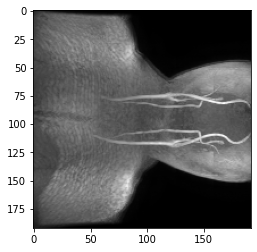

In [21]:
## 데이터셋 확인 (with LDS)
for img, label, _ in train_set:
    print(img.shape)
    print(label)
    plt.imshow(np.max(img, axis=2).squeeze(), cmap='gray')
    plt.show()
    break

# EPOCH 1 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.03it/s]


# EPOCH 2 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.07it/s]


# EPOCH 3 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 4 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.04it/s]
/home/jhj/.conda/envs/a6000/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/home/jhj/.conda/envs/a6000/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


# EPOCH 5 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


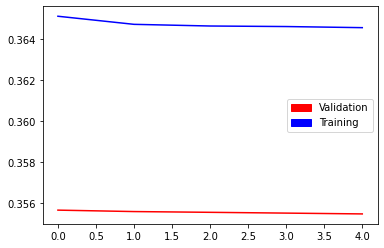

# EPOCH 6 / 100


  0%|                                                   | 0/195 [00:27<?, ?it/s]


KeyboardInterrupt: 

In [45]:
normalization = 'groupnorm'
num_epochs = 100
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0
blocknum = 2
patience = 20
patience_cnt = 0

### VNet pretrained model 가져오기
set_seed()

out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc], dropout_p=dropout_rate)
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/seg_2305_vnetencoder-{}_{}_bestmodel'.format(blocknum, img_size)), strict=False)
net.cuda()

### Parameter freeze X
#     for i, [name, param] in enumerate(net.named_parameters()):
#         if 'encoder' in name:
#             param.requires_grad = False

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "VNet-{}".format(blocknum),
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230504_ieie_vnet-{}'.format(blocknum))
        patience_cnt = 0
    else:
        patience_cnt += 1
    
    if patience_cnt >= patience:
        wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
                   "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
        break

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

train_mae,█▇▁▆▇
train_mse,█▃▂▂▁
train_pearson,▇▃█▃▁
train_spearman,▆▁█▃▂
valid_mae,▁▂▄▆█
valid_mse,█▅▄▂▁
valid_pearson,▁██
valid_spearman,▁▆█
train_mae,0.31435
train_mse,0.36455
train_pearson,-0.01977


# EPOCH 1 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.15it/s]


# EPOCH 2 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.14it/s]


# EPOCH 3 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.14it/s]


# EPOCH 4 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.15it/s]


# EPOCH 5 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


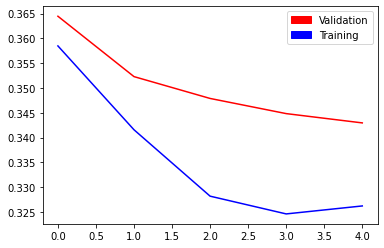

# EPOCH 6 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.14it/s]


# EPOCH 7 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.14it/s]


# EPOCH 8 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.15it/s]


# EPOCH 9 / 100


100%|███████████████████████████████████████████| 49/49 [00:41<00:00,  1.17it/s]


# EPOCH 10 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


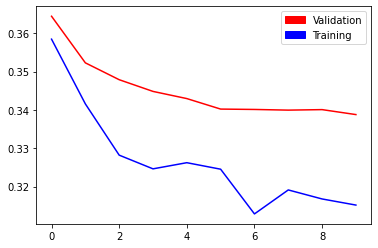

# EPOCH 11 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


# EPOCH 12 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.11it/s]


# EPOCH 13 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.14it/s]


# EPOCH 14 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.15it/s]


# EPOCH 15 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


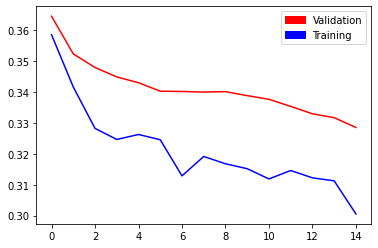

# EPOCH 16 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.11it/s]


# EPOCH 17 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.14it/s]


# EPOCH 18 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.11it/s]


# EPOCH 19 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.11it/s]


# EPOCH 20 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


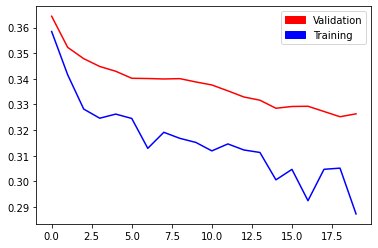

# EPOCH 21 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.14it/s]


# EPOCH 22 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


# EPOCH 23 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.15it/s]


# EPOCH 24 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


# EPOCH 25 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


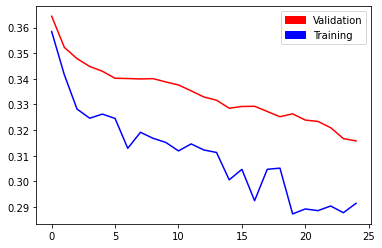

# EPOCH 26 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


# EPOCH 27 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


# EPOCH 28 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


# EPOCH 29 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.11it/s]


# EPOCH 30 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.10it/s]


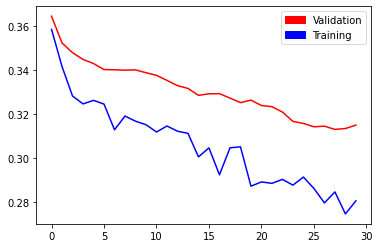

# EPOCH 31 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


# EPOCH 32 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


# EPOCH 33 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.15it/s]


# EPOCH 34 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


# EPOCH 35 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.10it/s]


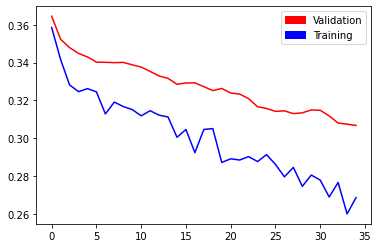

# EPOCH 36 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.11it/s]


# EPOCH 37 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.15it/s]


# EPOCH 38 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


# EPOCH 39 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


# EPOCH 40 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


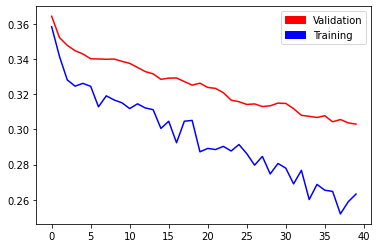

# EPOCH 41 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.09it/s]


# EPOCH 42 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


# EPOCH 43 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.15it/s]


# EPOCH 44 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


# EPOCH 45 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


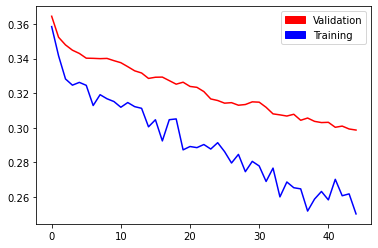

# EPOCH 46 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.11it/s]


# EPOCH 47 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


# EPOCH 48 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.15it/s]


# EPOCH 49 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


# EPOCH 50 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.11it/s]


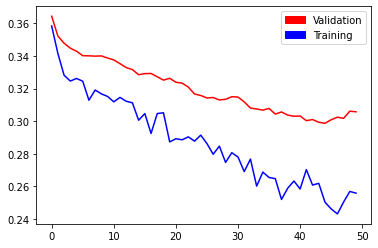

# EPOCH 51 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.11it/s]


# EPOCH 52 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.11it/s]


# EPOCH 53 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


# EPOCH 54 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


# EPOCH 55 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


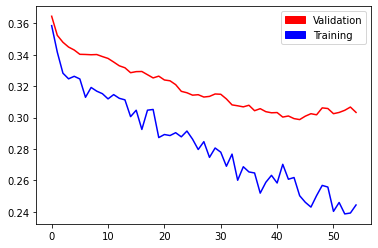

# EPOCH 56 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


# EPOCH 57 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.15it/s]


# EPOCH 58 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.11it/s]


# EPOCH 59 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


# EPOCH 60 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


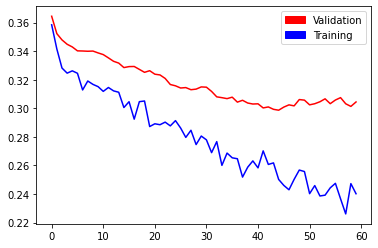

# EPOCH 61 / 100


100%|███████████████████████████████████████████| 49/49 [00:42<00:00,  1.14it/s]


# EPOCH 62 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.12it/s]


# EPOCH 63 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


# EPOCH 64 / 100


100%|███████████████████████████████████████████| 49/49 [00:43<00:00,  1.13it/s]


# EPOCH 65 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.11it/s]


train_mae,█▆▅▅▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▁▂▁▂▁▁▂▁▁
train_mse,█▇▆▆▆▆▆▆▆▅▅▅▄▄▄▄▄▄▄▃▄▃▃▂▃▃▃▂▂▂▃▂▂▂▂▁▂▂▂▁
train_pearson,▂▁▂▂▃▃▃▃▃▅▅▄▆▆▅▅▆▆▆▆▆▆▆▇▆▆▇▇▇▇▇▇█▇▇█▇▇▇█
train_spearman,▁▁▂▃▃▃▄▄▅▅▆▅▆▇▆▇▇▇▇▆▇▇▇▇▆▇▇█▇▇▇▇██▇▇▇▇██
valid_mae,█▆▅▅▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▃▃▃▂▃▂▂▂▂▂▂▁▂▂▂▁▂▁▂▁▁
valid_mse,█▇▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▂▁▂▁▂▁▂▂▁▁
valid_pearson,▁▁▁▁▁▁▁▃▃▄▄▅▅▆▆▇▇▇▇▇▇▇▇█▇█████▇███▇█▇███
valid_spearman,▁▁▁▂▂▃▃▄▅▅▅▆▆▇▇██▇█▇▇▇▇▇▇▇▇▇▇▇▆▇▇▇▆▇▆▆▆▆
train_mae,0.3301
train_mse,0.23333
train_pearson,0.52955


In [46]:
normalization = 'groupnorm'
num_epochs = 100
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0
blocknum = 3
patience = 20
patience_cnt = 0

### VNet pretrained model 가져오기
set_seed()

out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc], dropout_p=dropout_rate)
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/seg_2305_vnetencoder-{}_{}_bestmodel'.format(blocknum, img_size)), strict=False)
net.cuda()

### Parameter freeze X
#     for i, [name, param] in enumerate(net.named_parameters()):
#         if 'encoder' in name:
#             param.requires_grad = False

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "VNet-{}".format(blocknum),
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230504_ieie_vnet-{}'.format(blocknum))
        patience_cnt = 0
    else:
        patience_cnt += 1
    
    if patience_cnt >= patience:
        wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
                   "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
        break

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

In [ ]:
normalization = 'groupnorm'
num_epochs = 100
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0
blocknum = 4
patience = 20
patience_cnt = 0

### VNet pretrained model 가져오기
set_seed()

out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc], dropout_p=dropout_rate)
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/seg_2305_vnetencoder-{}_{}_bestmodel'.format(blocknum, img_size)), strict=False)
net.cuda()

### Parameter freeze X
#     for i, [name, param] in enumerate(net.named_parameters()):
#         if 'encoder' in name:
#             param.requires_grad = False

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "VNet-{}".format(blocknum),
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230504_ieie_vnet-{}'.format(blocknum))
        patience_cnt = 0
    else:
        patience_cnt += 1
    
    if patience_cnt >= patience:
        wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
                   "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
        break

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

In [22]:
normalization = 'groupnorm'
num_epochs = 700
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0
blocknum = 1
patience = 20
patience_cnt = 0

### VNet pretrained model 가져오기
set_seed()

out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc], dropout_p=dropout_rate)
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/seg_2304_vnetencoder-{}_{}_bestmodel'.format(blocknum, img_size)), strict=False)
net.cuda()

### Parameter freeze X
#     for i, [name, param] in enumerate(net.named_parameters()):
#         if 'encoder' in name:
#             param.requires_grad = False

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "VNet-{}".format(blocknum),
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230505_ieie_vnet-{}'.format(blocknum))
        patience_cnt = 0
    else:
        patience_cnt += 1
    
    if patience_cnt >= patience:
        wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
                   "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
        break

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: hei-jung. Use `wandb login --relogin` to force relogin


# EPOCH 1 / 700


100%|███████████████████████████████████████████| 25/25 [00:39<00:00,  1.59s/it]


# EPOCH 2 / 700


100%|███████████████████████████████████████████| 25/25 [00:37<00:00,  1.49s/it]


# EPOCH 3 / 700


 46%|███████████████████▋                       | 45/98 [02:06<02:29,  2.82s/it]


RuntimeError: DataLoader worker (pid 2258257) is killed by signal: Killed. 

In [ ]:
normalization = 'groupnorm'
num_epochs = 700
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0
blocknum = 2
patience = 20
patience_cnt = 0

### VNet pretrained model 가져오기
set_seed()

out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc], dropout_p=dropout_rate)
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/seg_2304_vnetencoder-{}_{}_bestmodel'.format(blocknum, img_size)), strict=False)
net.cuda()

### Parameter freeze X
#     for i, [name, param] in enumerate(net.named_parameters()):
#         if 'encoder' in name:
#             param.requires_grad = False

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "VNet-{}".format(blocknum),
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230505_ieie_vnet-{}'.format(blocknum))
        patience_cnt = 0
    else:
        patience_cnt += 1
    
    if patience_cnt >= patience:
        wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
                   "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
        break

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

In [ ]:
normalization = 'groupnorm'
num_epochs = 700
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0
blocknum = 3
patience = 20
patience_cnt = 0

### VNet pretrained model 가져오기
set_seed()

out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc], dropout_p=dropout_rate)
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/seg_2304_vnetencoder-{}_{}_bestmodel'.format(blocknum, img_size)), strict=False)
net.cuda()

### Parameter freeze X
#     for i, [name, param] in enumerate(net.named_parameters()):
#         if 'encoder' in name:
#             param.requires_grad = False

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "VNet-{}".format(blocknum),
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230505_ieie_vnet-{}'.format(blocknum))
        patience_cnt = 0
    else:
        patience_cnt += 1
    
    if patience_cnt >= patience:
        wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
                   "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
        break

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

In [ ]:
normalization = 'groupnorm'
num_epochs = 700
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0
blocknum = 4
patience = 10
patience_cnt = 0

### VNet pretrained model 가져오기
set_seed()

out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc], dropout_p=dropout_rate)
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/seg_2304_vnetencoder-{}_{}_bestmodel'.format(blocknum, img_size)), strict=False)
net.cuda()

### Parameter freeze X
#     for i, [name, param] in enumerate(net.named_parameters()):
#         if 'encoder' in name:
#             param.requires_grad = False

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "VNet-{}".format(blocknum),
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230505_ieie_vnet-{}'.format(blocknum))
        patience_cnt = 0
    else:
        patience_cnt += 1
    
    if patience_cnt >= patience:
        wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
                   "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
        break

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)
ERROR:root:dropped chunk 404 Client Error: Not Found for url: https://api.wandb.ai/files/hei-jung/202304-IEIE/r9vlnpj8/file_stream
NoneType: None


# EPOCH 1 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 2 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


# EPOCH 3 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.75it/s]


# EPOCH 4 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 5 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


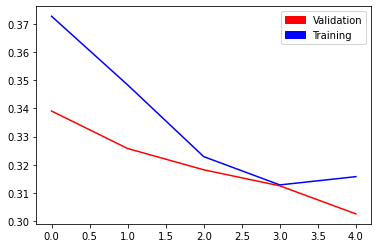

# EPOCH 6 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 7 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.75it/s]


# EPOCH 8 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


# EPOCH 9 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 10 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


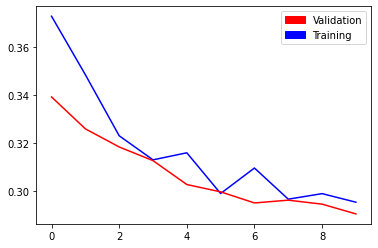

# EPOCH 11 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 12 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 13 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 14 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 15 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


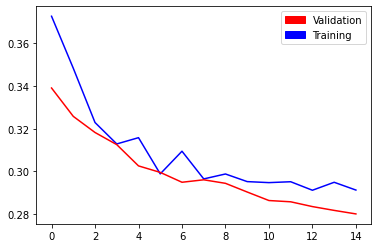

# EPOCH 16 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 17 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 18 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 19 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 20 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


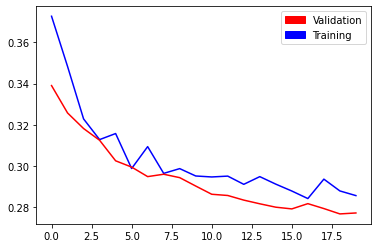

# EPOCH 21 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.70it/s]


# EPOCH 22 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.75it/s]


# EPOCH 23 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 24 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


# EPOCH 25 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


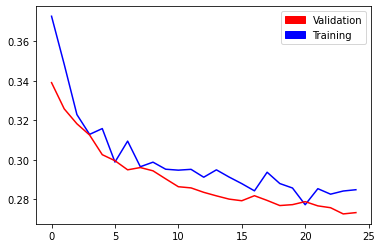

# EPOCH 26 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.72it/s]


# EPOCH 27 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 28 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


# EPOCH 29 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 30 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


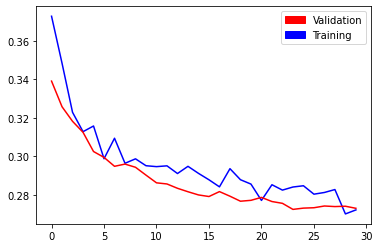

# EPOCH 31 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


# EPOCH 32 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 33 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 34 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.75it/s]


# EPOCH 35 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


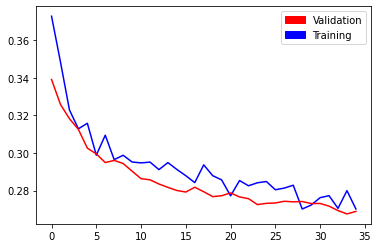

# EPOCH 36 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 37 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 38 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 39 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 40 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


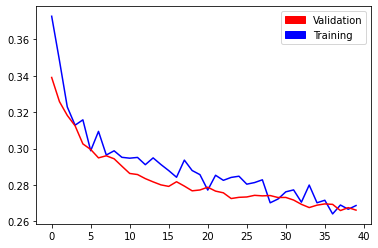

# EPOCH 41 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 42 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 43 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 44 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 45 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


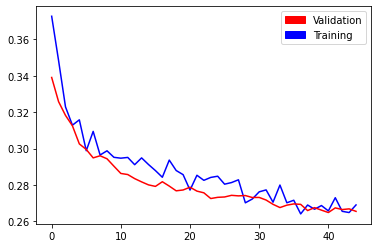

# EPOCH 46 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


# EPOCH 47 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.75it/s]


# EPOCH 48 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 49 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 50 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


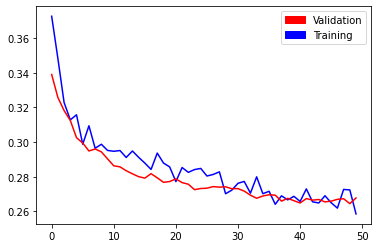

# EPOCH 51 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 52 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


# EPOCH 53 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 54 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 55 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


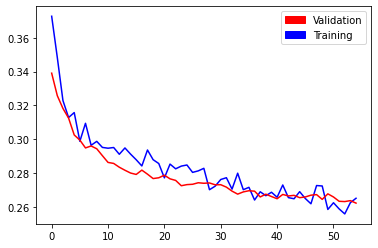

# EPOCH 56 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 57 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 58 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 59 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 60 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


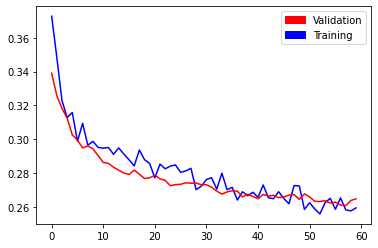

# EPOCH 61 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 62 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 63 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


# EPOCH 64 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 65 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


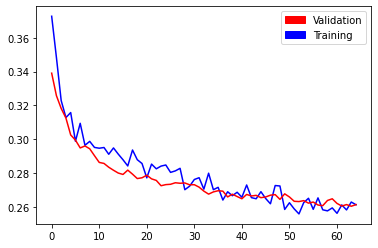

# EPOCH 66 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 67 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 68 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 69 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 70 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


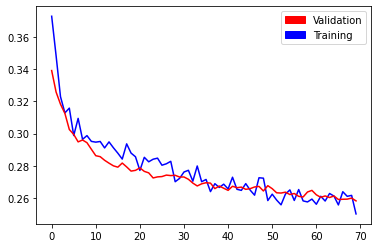

# EPOCH 71 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 72 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 73 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 74 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.73it/s]


# EPOCH 75 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


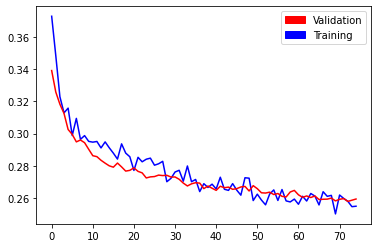

# EPOCH 76 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 77 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 78 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 79 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 80 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


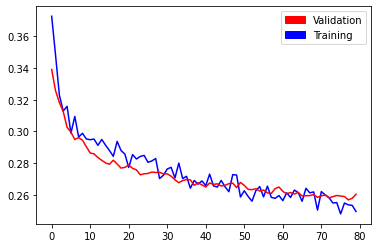

# EPOCH 81 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


# EPOCH 82 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 83 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 84 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 85 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


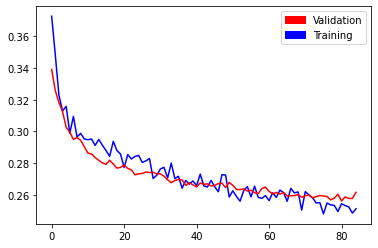

# EPOCH 86 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 87 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 88 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 89 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 90 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


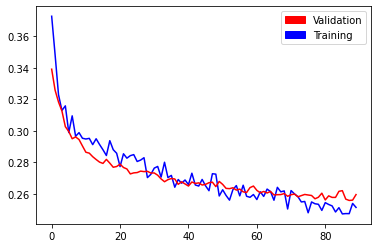

# EPOCH 91 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 92 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 93 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 94 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 95 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


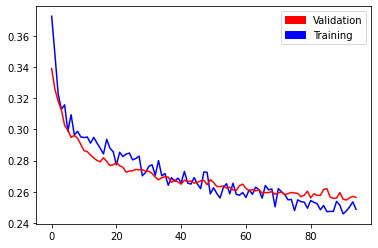

# EPOCH 96 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 97 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 98 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 99 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 100 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


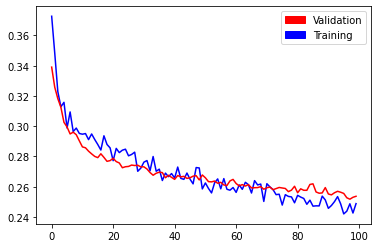

train_mae,▆█▆▇▆▆▅▆▅▅▅▅▅▅▄▄▄▄▄▄▃▃▃▂▃▃▃▃▃▂▃▂▃▂▂▁▂▂▂▁
train_mse,█▅▄▄▄▄▃▄▃▃▃▃▃▃▃▂▂▂▂▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂▁▂▁▁
train_pearson,▁▂▅▅▅▅▆▅▆▆▆▆▆▆▇▇▇▇▇▆▇▇▇▇▇▇▇▇▇▇▇████▇████
train_spearman,▁▂▅▅▅▆▆▅▆▆▆▆▆▆▆▇▇▇▇▆▇▇▇▇▇▇▇▇▇███▇█████▇█
valid_mae,██▆▆▅▅▄▄▅▄▄▅▅▂▄▄▂▄▄▃▄▃▃▄▄▂▂▃▃▂▃▃▄▂▃▂▃▃▁▃
valid_mse,█▆▅▅▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
valid_pearson,▁▅▇▇▇▇▇▇▇▇▇▇▇▇▇▇████████████████████████
valid_spearman,▁▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇███████████████████████
train_mae,0.30839
train_mse,0.24885
train_pearson,0.47328


In [26]:
num_epochs = 100
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0

set_seed()

def forward(self, x):
    x = self.feature_extractor(x)
    # add SEBlock
    x = self.seblock(x)*x
    x = self.classifier(x)
    x = x.view(x.size(0), -1)
    x = self.fc(x)
    return x

net = SFCN()
net.seblock = SEBlock(64)
net.fc = nn.Sequential(
    nn.Linear(384, 1),
    nn.LeakyReLU(),
)
net.forward = types.MethodType(forward, net)
net.cuda()

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "SE-SFCN",
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230430_ieie_se-sfcn')

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

# EPOCH 1 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 2 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 3 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 4 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 5 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.75it/s]


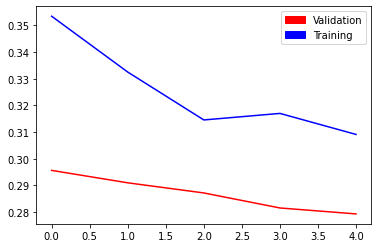

# EPOCH 6 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.86it/s]


# EPOCH 7 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.81it/s]


# EPOCH 8 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 9 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 10 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


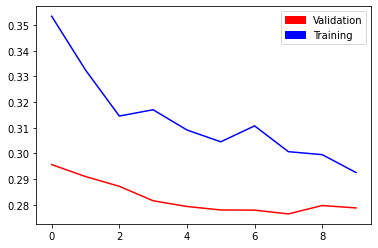

# EPOCH 11 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 12 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 13 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.88it/s]


# EPOCH 14 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 15 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


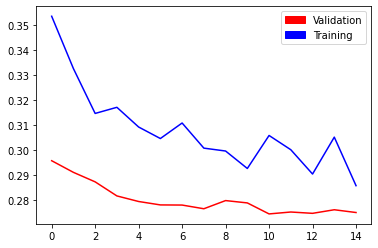

# EPOCH 16 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 17 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 18 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 19 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 20 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


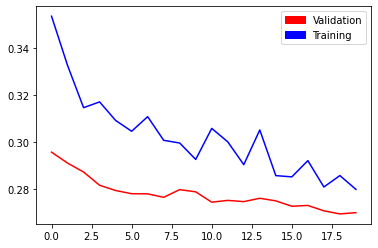

# EPOCH 21 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 22 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 23 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 24 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 25 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


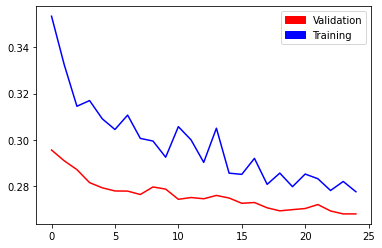

# EPOCH 26 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 27 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


# EPOCH 28 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


# EPOCH 29 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 30 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


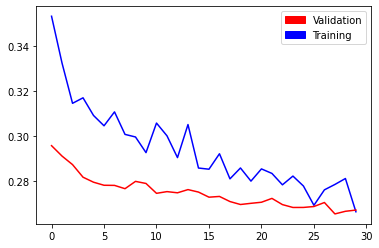

# EPOCH 31 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 32 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 33 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 34 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 35 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


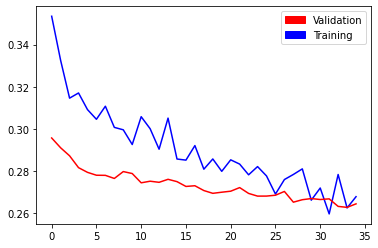

# EPOCH 36 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 37 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 38 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 39 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.75it/s]


# EPOCH 40 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


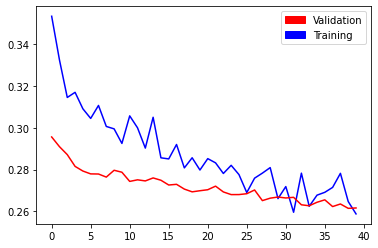

# EPOCH 41 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 42 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.86it/s]


# EPOCH 43 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 44 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


# EPOCH 45 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


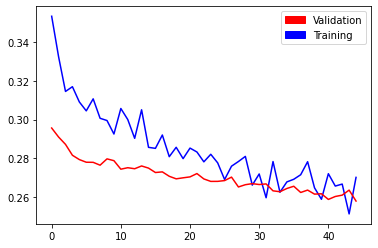

# EPOCH 46 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 47 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 48 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


# EPOCH 49 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 50 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


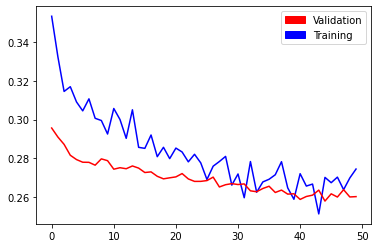

# EPOCH 51 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 52 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 53 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.75it/s]


# EPOCH 54 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 55 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


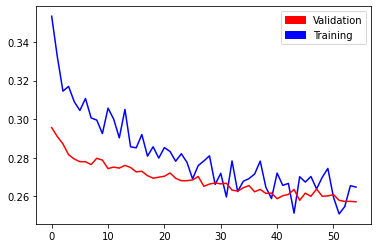

# EPOCH 56 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 57 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 58 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 59 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 60 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


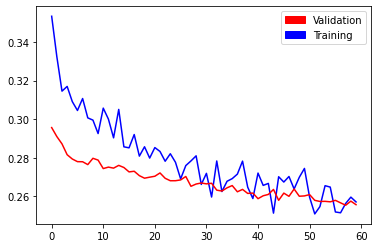

# EPOCH 61 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 62 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 63 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 64 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 65 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


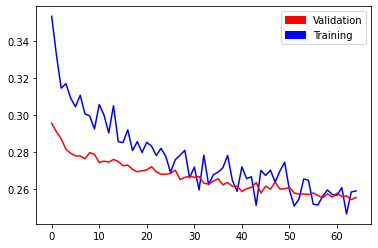

# EPOCH 66 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 67 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 68 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 69 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 70 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


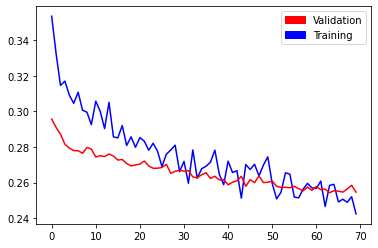

# EPOCH 71 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


# EPOCH 72 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 73 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 74 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 75 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


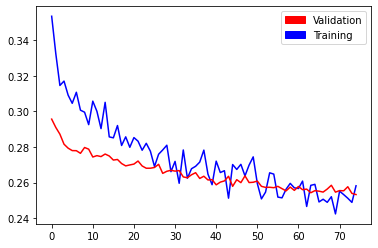

# EPOCH 76 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.86it/s]


# EPOCH 77 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 78 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 79 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 80 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


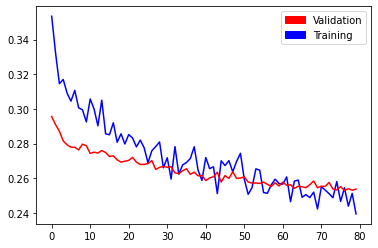

# EPOCH 81 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 82 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 83 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 84 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 85 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


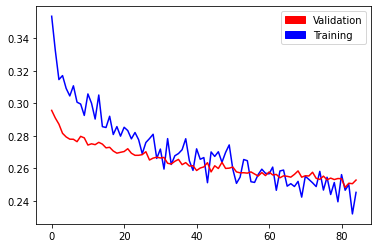

# EPOCH 86 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 87 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 88 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 89 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.87it/s]


# EPOCH 90 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


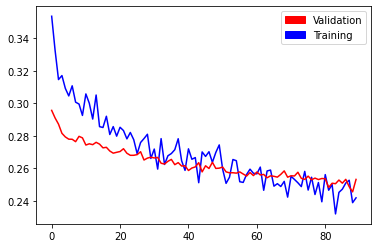

# EPOCH 91 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 92 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 93 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 94 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 95 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.75it/s]


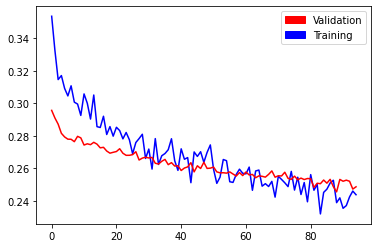

# EPOCH 96 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 97 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 98 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 99 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.86it/s]


# EPOCH 100 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


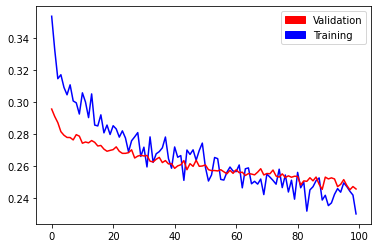

train_mae,█▇▇▆▇▅▆▅▆▅▄▅▄▄▄▄▄▃▄▄▄▄▃▃▃▃▃▃▃▃▃▂▃▂▂▁▂▂▂▁
train_mse,█▆▅▅▅▄▄▄▄▄▃▄▃▃▃▃▃▂▃▃▃▃▂▃▂▃▂▂▂▂▂▂▂▁▂▁▁▂▂▁
train_pearson,▁▃▄▄▄▅▅▅▅▅▆▅▆▆▆▆▆▇▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇█▇██▇▇█
train_spearman,▁▄▄▅▄▅▅▆▄▆▆▅▆▆▆▆▆▇▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇█
valid_mae,▇█▇▇▅▆▅▄▅▆▆▆▇▄▇▅▂▆▆▄▄▃▃▆▆▃▁▄▄▃▃▃▂▂▆▁▅▂▂▂
valid_mse,█▇▆▅▅▅▅▅▄▄▄▄▄▃▄▃▃▄▃▃▃▃▃▃▃▂▂▃▂▂▂▂▁▂▂▁▂▁▁▁
valid_pearson,▁▂▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▆▇▇▇▇▇▇▇█▇███
valid_spearman,▁▁▃▃▄▄▄▅▅▆▅▆▆▆▆▆▆▆▇▇▆▇▇▇▇▇▇▇▇▇█▇████████
train_mae,0.30244
train_mse,0.23032
train_pearson,0.53106


In [27]:
num_epochs = 100
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0

set_seed()

net = SFCN()
net.fc = nn.Sequential(
    nn.Linear(384, 1),
    nn.LeakyReLU(),
)
net.cuda()

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "SFCN",
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230430_ieie_sfcn')

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

# EPOCH 1 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 2 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 3 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 4 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 5 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


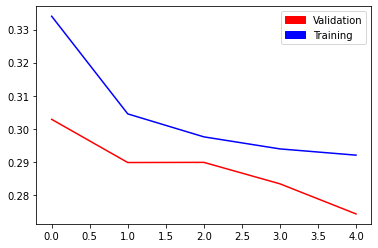

# EPOCH 6 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 7 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 8 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 9 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 10 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


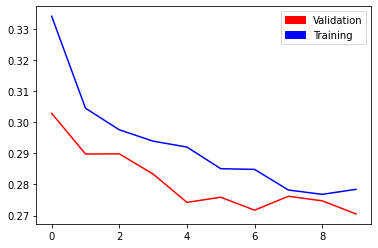

# EPOCH 11 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 12 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 13 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 14 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.73it/s]


# EPOCH 15 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


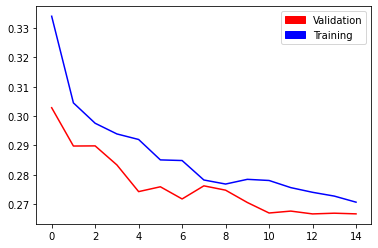

# EPOCH 16 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 17 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 18 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 19 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 20 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


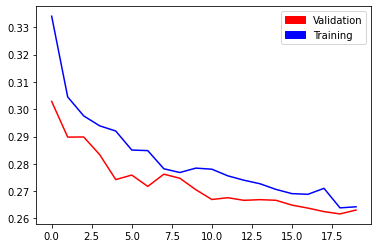

# EPOCH 21 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 22 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 23 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 24 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 25 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.72it/s]


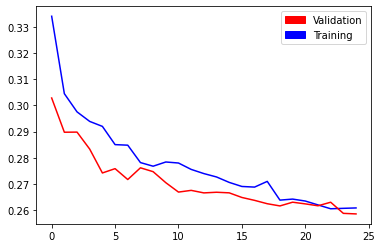

# EPOCH 26 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 27 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 28 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 29 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.81it/s]


# EPOCH 30 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


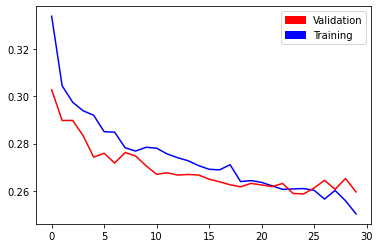

# EPOCH 31 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 32 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 33 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 34 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.75it/s]


# EPOCH 35 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


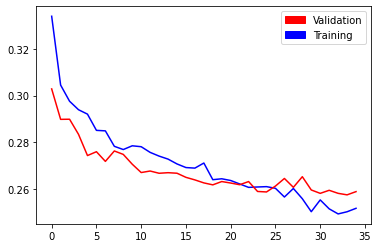

# EPOCH 36 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 37 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 38 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 39 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 40 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


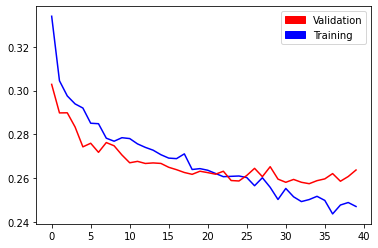

# EPOCH 41 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 42 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 43 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.73it/s]


# EPOCH 44 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 45 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


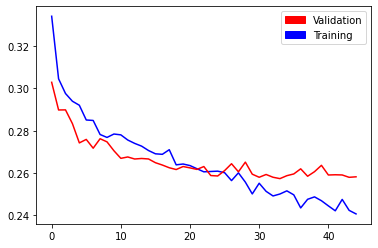

# EPOCH 46 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 47 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 48 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 49 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 50 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.73it/s]


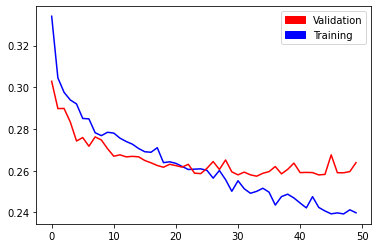

# EPOCH 51 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 52 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 53 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 54 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 55 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


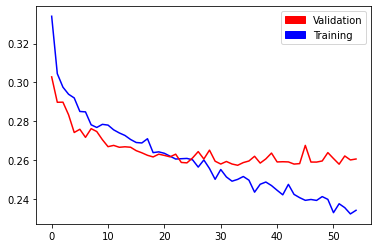

# EPOCH 56 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


# EPOCH 57 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 58 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 59 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 60 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.75it/s]


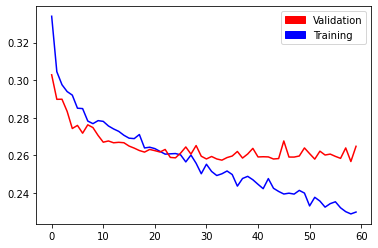

# EPOCH 61 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 62 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 63 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 64 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 65 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


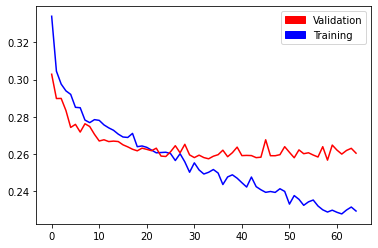

# EPOCH 66 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 67 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 68 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 69 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 70 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


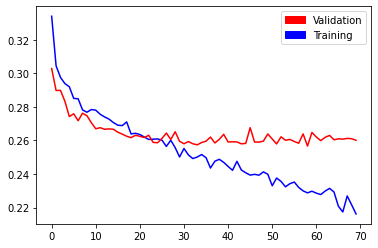

# EPOCH 71 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 72 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 73 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 74 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.73it/s]


# EPOCH 75 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.75it/s]


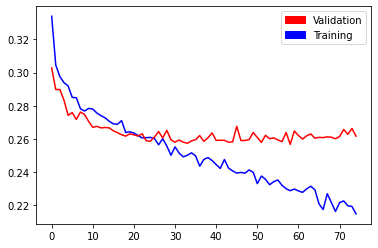

# EPOCH 76 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 77 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


# EPOCH 78 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 79 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 80 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


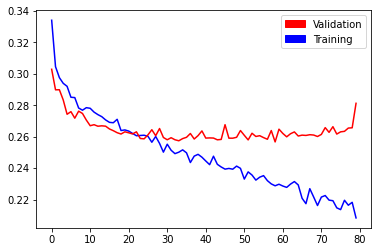

# EPOCH 81 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 82 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 83 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 84 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 85 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


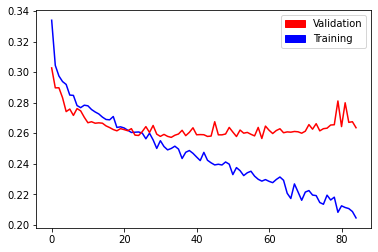

# EPOCH 86 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 87 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 88 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 89 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 90 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.75it/s]


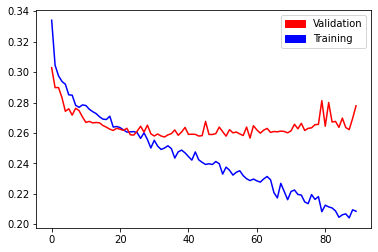

# EPOCH 91 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 92 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 93 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 94 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 95 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


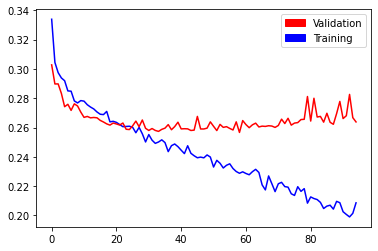

# EPOCH 96 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 97 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 98 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.75it/s]


# EPOCH 99 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 100 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


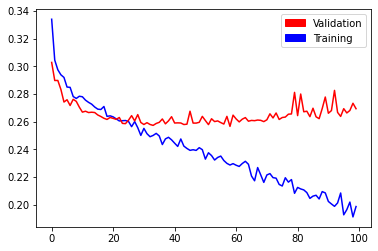

train_mae,▆█▇▇▇▆▆▆▆▅▅▅▅▅▅▅▄▄▄▄▃▃▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁
train_mse,█▆▆▅▅▅▅▅▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁
train_pearson,▁▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇███████
train_spearman,▁▅▅▆▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇██████████████
valid_mae,▆█▆▆▂▃▁▂▃▄▃▁▁▂▃▃▁▂▅▃▃▃▃▂▄▄▂▃▅▅▄▁▇▅▂▂▅▄▃▄
valid_mse,█▆▄▄▃▃▂▂▂▂▂▂▁▁▁▂▁▁▃▁▂▂▁▁▂▂▂▂▂▂▂▂▅▃▂▃▃▃▂▃
valid_pearson,▁▃▄▄▅▅▅▆▆▇▇▇▇██▇▇█▇█▇▇███▇▇▇▇▇▇▇▇▇▇▆▇▆▆▆
valid_spearman,▁▄▅▆▆▆▆▇███▇███▇▇███▇▇▇▇▇▇▇▇▇▇▇▆▆▇▆▆▇▆▆▆
train_mae,0.28719
train_mse,0.19877
train_pearson,0.62924


In [28]:
num_epochs = 100
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0

set_seed()

net = resnet(model_depth=10, in_channels=1, num_classes=1)
net.cuda()

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "Resnet10",
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230430_ieie_resnet10')

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: hei-jung. Use `wandb login --relogin` to force relogin


# EPOCH 1 / 100


100%|███████████████████████████████████████████| 49/49 [00:52<00:00,  1.07s/it]


# EPOCH 2 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.03it/s]


# EPOCH 3 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 4 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.03it/s]


# EPOCH 5 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.03it/s]


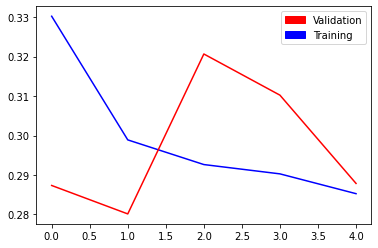

# EPOCH 6 / 100


100%|███████████████████████████████████████████| 49/49 [00:48<00:00,  1.01it/s]


# EPOCH 7 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 8 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 9 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.02it/s]


# EPOCH 10 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.03it/s]


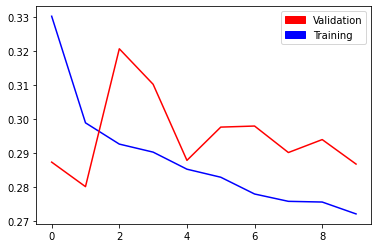

# EPOCH 11 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.03it/s]


# EPOCH 12 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


# EPOCH 13 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 14 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.03it/s]


# EPOCH 15 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


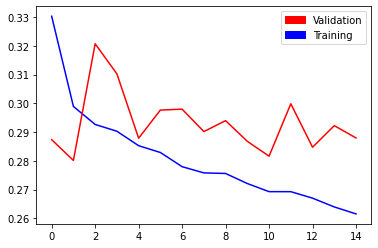

# EPOCH 16 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.02it/s]


# EPOCH 17 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 18 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


# EPOCH 19 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.04it/s]


# EPOCH 20 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.03it/s]


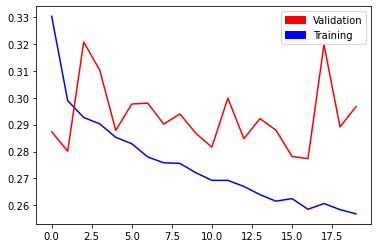

# EPOCH 21 / 100


100%|███████████████████████████████████████████| 49/49 [00:48<00:00,  1.01it/s]


# EPOCH 22 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


# EPOCH 23 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 24 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.03it/s]


# EPOCH 25 / 100


100%|███████████████████████████████████████████| 49/49 [00:48<00:00,  1.00it/s]


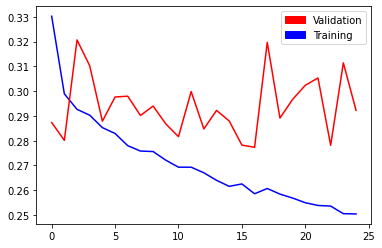

# EPOCH 26 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.03it/s]


# EPOCH 27 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.09it/s]


# EPOCH 28 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 29 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.07it/s]


# EPOCH 30 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


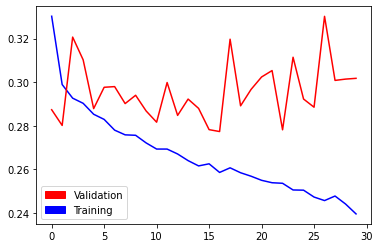

# EPOCH 31 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 32 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


# EPOCH 33 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 34 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 35 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


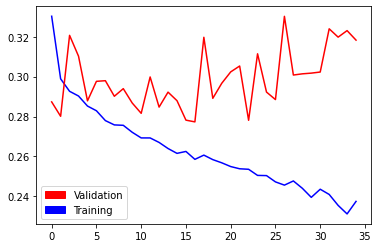

# EPOCH 36 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 37 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


# EPOCH 38 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 39 / 100


100%|███████████████████████████████████████████| 49/49 [00:48<00:00,  1.02it/s]


# EPOCH 40 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


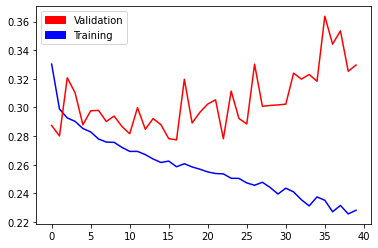

# EPOCH 41 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.02it/s]


# EPOCH 42 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 43 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.03it/s]


# EPOCH 44 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 45 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


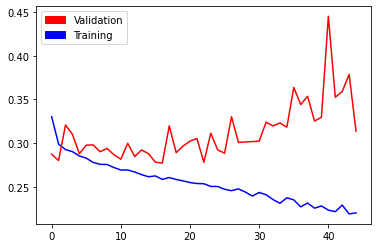

# EPOCH 46 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 47 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 48 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 49 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 50 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.07it/s]


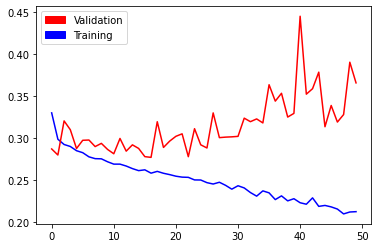

# EPOCH 51 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 52 / 100


100%|███████████████████████████████████████████| 49/49 [00:49<00:00,  1.00s/it]


# EPOCH 53 / 100


100%|███████████████████████████████████████████| 49/49 [00:48<00:00,  1.01it/s]


# EPOCH 54 / 100


100%|███████████████████████████████████████████| 49/49 [00:48<00:00,  1.02it/s]


# EPOCH 55 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.08it/s]


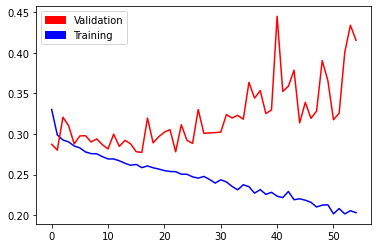

# EPOCH 56 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.04it/s]


# EPOCH 57 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 58 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 59 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 60 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


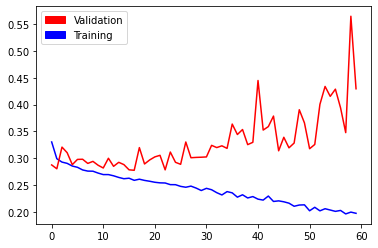

# EPOCH 61 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.08it/s]


# EPOCH 62 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 63 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.04it/s]


# EPOCH 64 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


# EPOCH 65 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.03it/s]


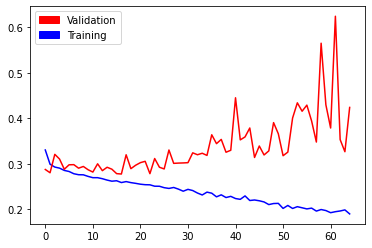

# EPOCH 66 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 67 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


# EPOCH 68 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 69 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


# EPOCH 70 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


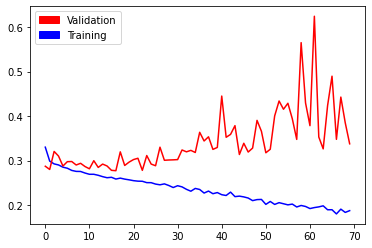

# EPOCH 71 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 72 / 100


100%|███████████████████████████████████████████| 49/49 [00:48<00:00,  1.01it/s]


# EPOCH 73 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.02it/s]


# EPOCH 74 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.02it/s]


# EPOCH 75 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.07it/s]


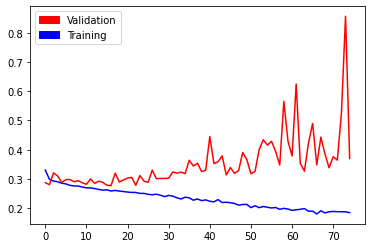

# EPOCH 76 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.09it/s]


# EPOCH 77 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.04it/s]


# EPOCH 78 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.08it/s]


# EPOCH 79 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 80 / 100


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


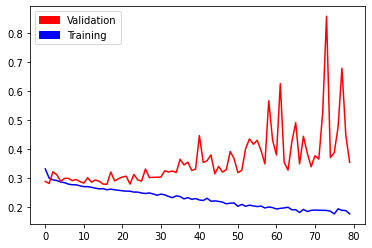

# EPOCH 81 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.07it/s]


# EPOCH 82 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.07it/s]


# EPOCH 83 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.08it/s]


# EPOCH 84 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 85 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


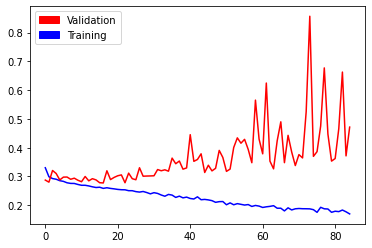

# EPOCH 86 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.07it/s]


# EPOCH 87 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.09it/s]


# EPOCH 88 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.09it/s]


# EPOCH 89 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.04it/s]


# EPOCH 90 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.10it/s]


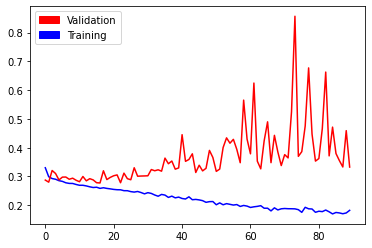

# EPOCH 91 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 92 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 93 / 100


100%|███████████████████████████████████████████| 49/49 [00:48<00:00,  1.02it/s]


# EPOCH 94 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


# EPOCH 95 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


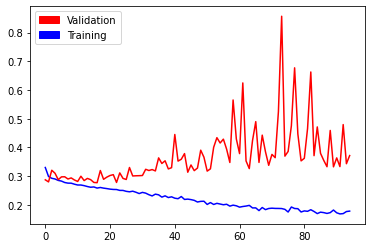

# EPOCH 96 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 97 / 100


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.10it/s]


# EPOCH 98 / 100


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.08it/s]


# EPOCH 99 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


# EPOCH 100 / 100


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.05it/s]


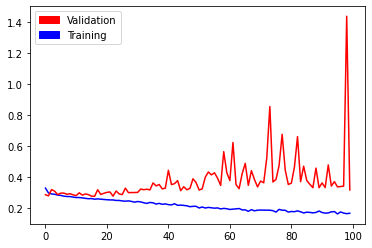

train_mae,█▅▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▂▂▂▁▁▁▁▁▁▁▁
train_mse,█▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
train_pearson,▁▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇██▇▇▇█████████
train_spearman,▁▄▄▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇████▇▇█████████
valid_mae,▁▃▂▂▁▁▁▃▂▁▂▂▂▃▃▂▄▃▃▃▂▄▄▆▂▂▂▃▃█▄▄▄▃▃▄▂▂▂▂
valid_mse,▁▂▁▁▁▁▁▂▁▁▁▁▁▂▂▂▃▂▂▂▁▃▃▄▂▂▂▂▂█▃▃▃▂▂▃▂▂▂▁
valid_pearson,▆▇▇▇▇▇▇███▇▇▇▇▇▅▅▅▅▅▄▄▃▄▃▃▂▃▂▅▄▁▃▄▃▃▄▄▃▄
valid_spearman,▇▇████▇███▇▇▇▇▇▅▅▅▅▅▄▄▄▄▄▄▃▄▃▅▄▁▂▄▂▃▄▄▃▄
train_mae,0.28779
train_mse,0.16768
train_pearson,0.69012


In [23]:
num_epochs = 100
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0

set_seed()

net = resnet(model_depth=18, in_channels=1, num_classes=1)
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.cuda()

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "Resnet18",
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230430_ieie_resnet18')

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

# EPOCH 1 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 2 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 3 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 4 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 5 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


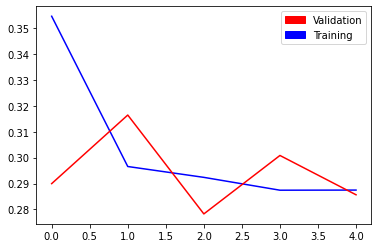

# EPOCH 6 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 7 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 8 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 9 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 10 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


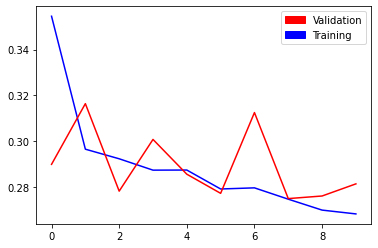

# EPOCH 11 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 12 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 13 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 14 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 15 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.75it/s]


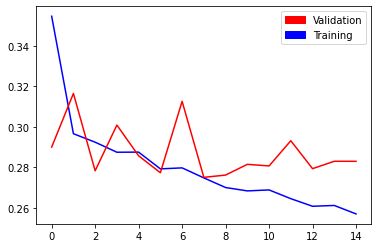

# EPOCH 16 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 17 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 18 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 19 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


# EPOCH 20 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


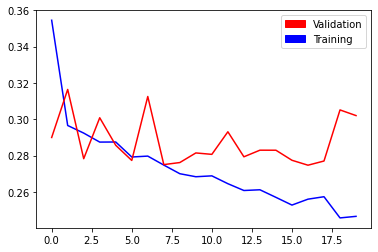

# EPOCH 21 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 22 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 23 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 24 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 25 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


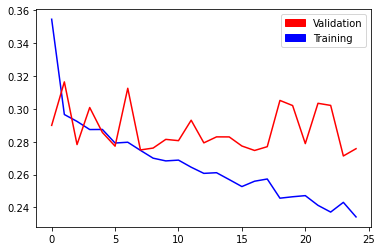

# EPOCH 26 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 27 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 28 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 29 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 30 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


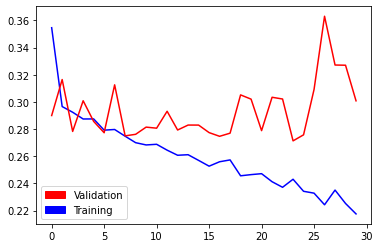

# EPOCH 31 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.73it/s]


# EPOCH 32 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 33 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 34 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 35 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


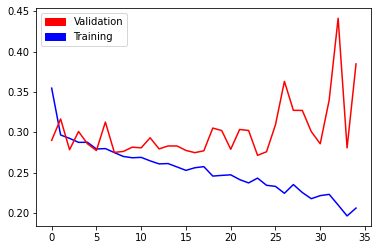

# EPOCH 36 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 37 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 38 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 39 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.75it/s]


# EPOCH 40 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


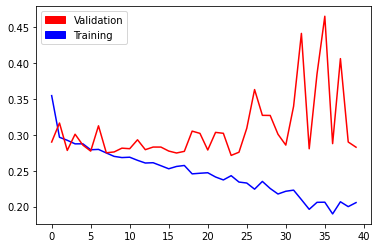

# EPOCH 41 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 42 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 43 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 44 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 45 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


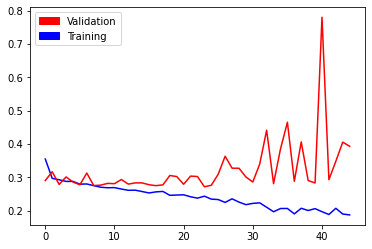

# EPOCH 46 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 47 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 48 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 49 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 50 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


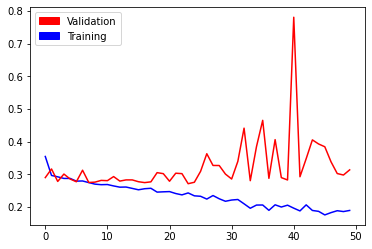

# EPOCH 51 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 52 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 53 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 54 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 55 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


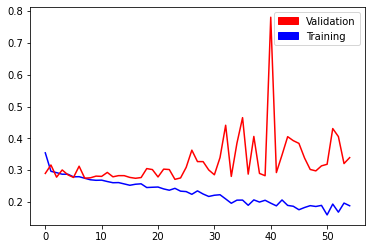

# EPOCH 56 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 57 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 58 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 59 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 60 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


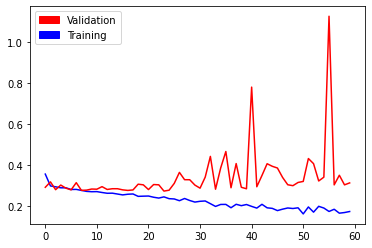

# EPOCH 61 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 62 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 63 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 64 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 65 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


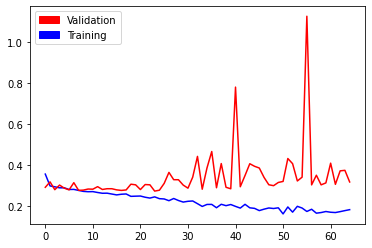

# EPOCH 66 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 67 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 68 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 69 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 70 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


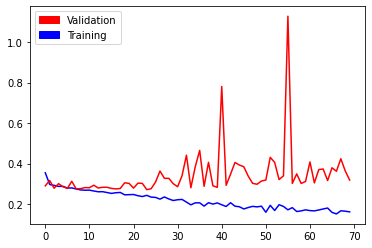

# EPOCH 71 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 72 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 73 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 74 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 75 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


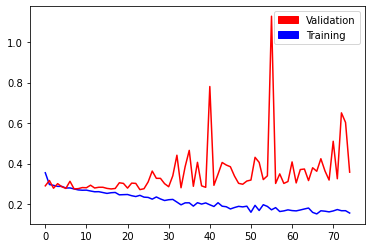

# EPOCH 76 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 77 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 78 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 79 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 80 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


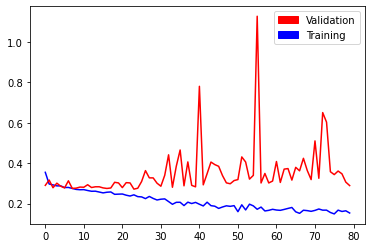

# EPOCH 81 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 82 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 83 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 84 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 85 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


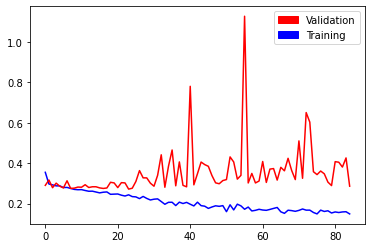

# EPOCH 86 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 87 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


# EPOCH 88 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 89 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 90 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


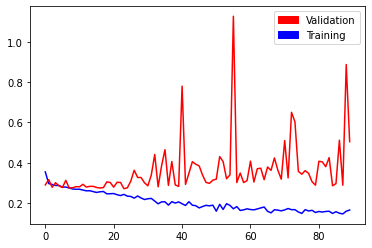

# EPOCH 91 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 92 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 93 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.75it/s]


# EPOCH 94 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 95 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


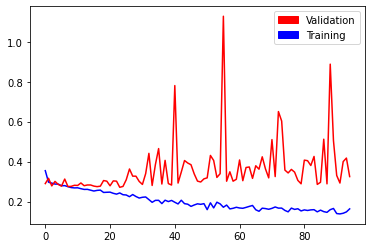

# EPOCH 96 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 97 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 98 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 99 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 100 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


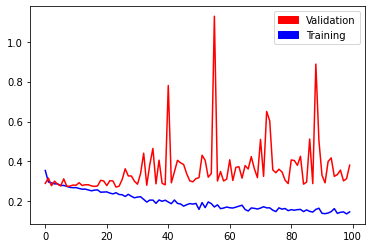

train_mae,█▇▇▆▆▆▅▆▅▅▅▅▄▃▃▄▃▃▃▃▂▄▃▂▂▃▂▂▃▃▂▂▂▂▂▂▁▂▂▂
train_mse,█▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▂▃▂▃▂▂▂▂▁▂▂▂▂▂▂▂▁▂▁▁▁▁
train_pearson,▁▃▄▄▄▅▅▅▅▅▆▆▆▇▆▇▇▇▇▇█▇▇▇▇▇█▇▇▇▇▇████████
train_spearman,▁▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇█▇▇████▇█▇█████████▇
valid_mae,▁▁▁▁▁▁▁▂▁▁▂▂▁▁▄▁▆▃▃▁▂▂█▁▂▃▃▃▂▅▃▂▃▂▄▇▁▂▂▃
valid_mse,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▅▂▂▁▁▁█▁▂▂▂▂▁▄▂▁▂▂▃▆▁▂▂▂
valid_pearson,▅▆▇▇▆▆▇▇▇▇▆▆▆▆▆▅▆▂▅▅▁▄▃▄▄▄▃▆▃▇▄▄▄▄▇█▅▆▃▅
valid_spearman,▅▅▆▇▆▆▆▇▆▆▆▅▆▇▅▄▅▃▆▃▁▄▃▃▅▃▁▇▄▆▄▃▄▆██▅▆▃▃
train_mae,0.27147
train_mse,0.14719
train_pearson,0.7347


In [30]:
num_epochs = 100
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0

set_seed()

net = resnet26(in_channels=1, num_classes=1)
net.cuda()

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "Resnet26",
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230430_ieie_resnet26')

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

# EPOCH 1 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 2 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 3 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 4 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 5 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


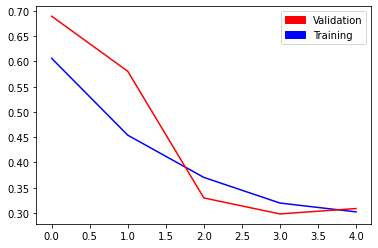

# EPOCH 6 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 7 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 8 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 9 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 10 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


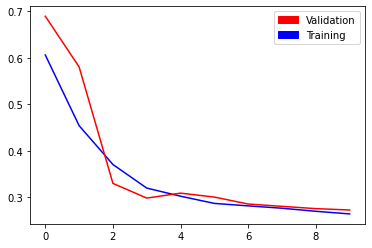

# EPOCH 11 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 12 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 13 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 14 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


# EPOCH 15 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


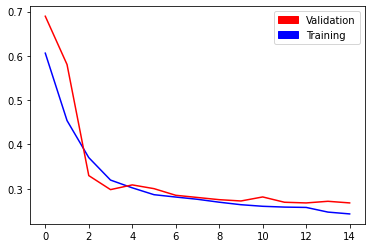

# EPOCH 16 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 17 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 18 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 19 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.86it/s]


# EPOCH 20 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


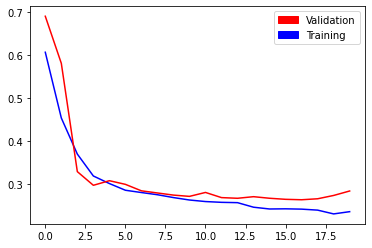

# EPOCH 21 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 22 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 23 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 24 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 25 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


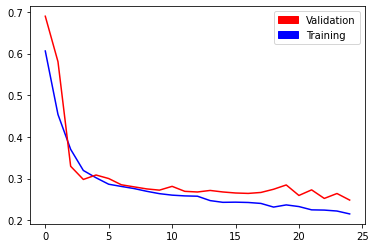

# EPOCH 26 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 27 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 28 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 29 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 30 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


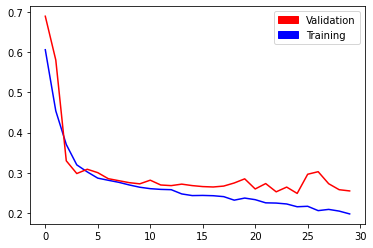

# EPOCH 31 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 32 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 33 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 34 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 35 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


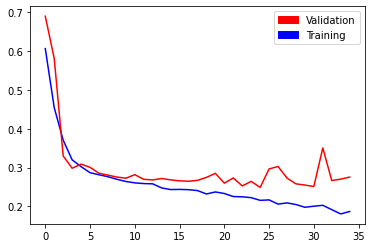

# EPOCH 36 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 37 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 38 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.86it/s]


# EPOCH 39 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 40 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


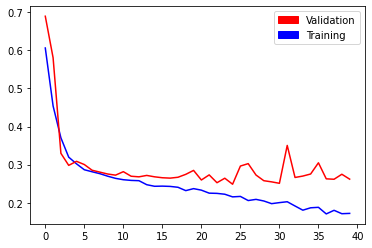

# EPOCH 41 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 42 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 43 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 44 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 45 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


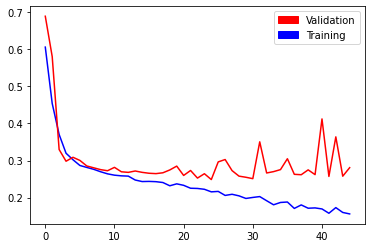

# EPOCH 46 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 47 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 48 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 49 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 50 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


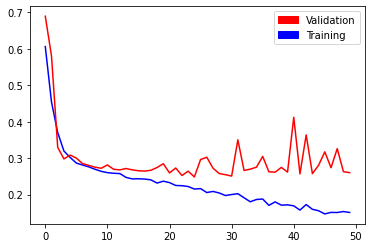

# EPOCH 51 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 52 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.81it/s]


# EPOCH 53 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 54 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 55 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


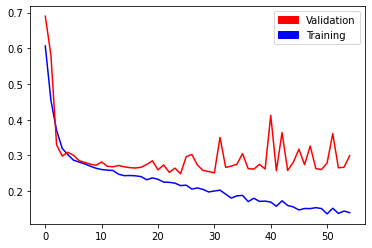

# EPOCH 56 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 57 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 58 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 59 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 60 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


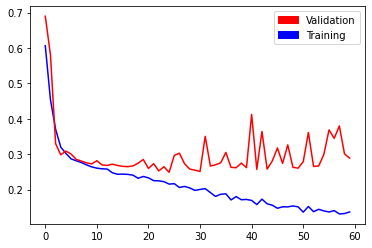

# EPOCH 61 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 62 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 63 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 64 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 65 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


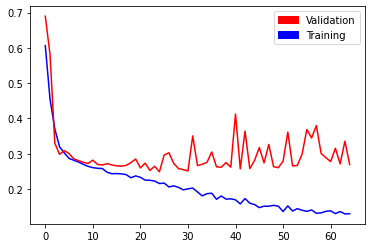

# EPOCH 66 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 67 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 68 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 69 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 70 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.85it/s]


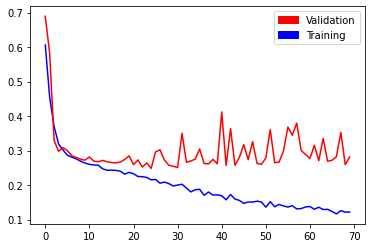

# EPOCH 71 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 72 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 73 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 74 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 75 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


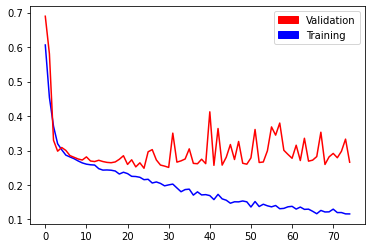

# EPOCH 76 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.84it/s]


# EPOCH 77 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 78 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.78it/s]


# EPOCH 79 / 100


100%|███████████████████████████████████████████| 49/49 [00:28<00:00,  1.74it/s]


# EPOCH 80 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


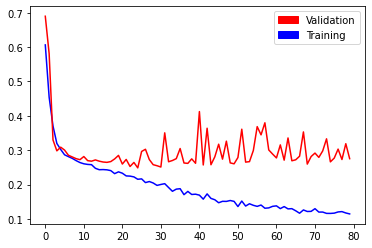

# EPOCH 81 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 82 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 83 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 84 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 85 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


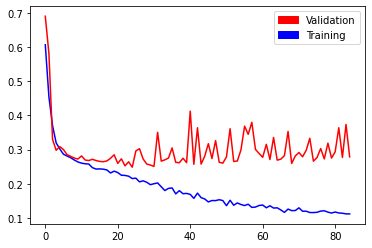

# EPOCH 86 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 87 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.77it/s]


# EPOCH 88 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 89 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 90 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


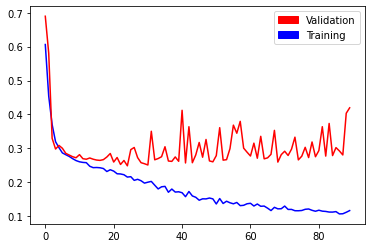

# EPOCH 91 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 92 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.81it/s]


# EPOCH 93 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 94 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.83it/s]


# EPOCH 95 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


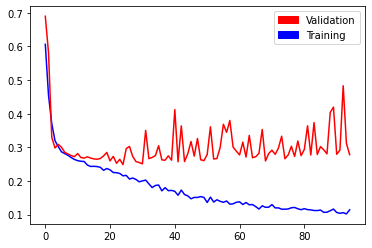

# EPOCH 96 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.79it/s]


# EPOCH 97 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 98 / 100


100%|███████████████████████████████████████████| 49/49 [00:26<00:00,  1.82it/s]


# EPOCH 99 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.80it/s]


# EPOCH 100 / 100


100%|███████████████████████████████████████████| 49/49 [00:27<00:00,  1.76it/s]


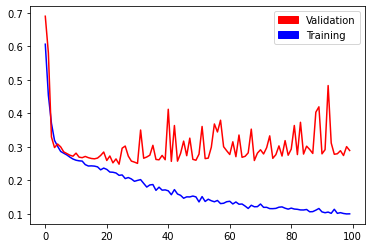

train_mae,█▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▅▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_pearson,▁▂▃▃▄▄▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇██████████████
train_spearman,▁▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇▇██▇█▇▇███▇█▇███
valid_mae,█▂▁▂▁▁▁▁▂▁▄▃▁▃▄▂▆▁▄▂▂▂▅▂▂▄▂▂▂▄▃▃▅▃▂▆▂▂▂▂
valid_mse,█▂▂▁▁▁▁▁▁▁▂▁▁▁▂▁▄▁▂▁▁▁▃▂▁▂▂▁▁▂▂▂▃▃▂▃▂▂▂▂
valid_pearson,▁▃▃▄▅▆▆▆▇▇█▇███▇▇▇▇▇▆▇▆▇▆▆▅█▅▇▇▆▅▆▅▆▆▅▆▆
valid_spearman,▁▄▄▅▆▇▇▇███▇▇▇▇▆▅▆▆▅▄▆▅▅▅▅▃▆▄▅▃▄▄▅▄▅▅▅▅▅
train_mae,0.23022
train_mse,0.10064
train_pearson,0.82883


In [31]:
num_epochs = 100
weight_decay = 0.01
lr = 1e-06
optim_class = optim.AdamW
dropout_rate = 0.
start_update = 0

set_seed()

net = inception_resnet_v2(in_channels=1, num_classes=1)
net.cuda()

### W&B 설정
wandb.init(
    project='202304-IEIE',
    config={"model": "Inception-Resnet-v2",
            "start_lr": lr, "epochs": num_epochs, "batch_size": batch_size,
            "cost_function": "mse", "optimizer": optim_class.__name__, "weight_decay": weight_decay,},
    notes='train with %d data'%(len(train_set)))
wandb.watch(net)

### 학습 시작
train_losses = []
validation_losses = []
min_valid_loss = 1.0

optimizer = optim_class(net.parameters(), lr=lr, weight_decay=weight_decay)
criterion1 = nn.MSELoss()
criterion2 = nn.L1Loss()

set_seed()
for epoch in range(num_epochs):
    # train set
    augment = get_augmentation_transform()
    train_set.transform = tio.transforms.Compose([preprocess, augment])
    train_loader = DataLoader(train_set, batch_size=batch_size, num_workers=16)

    print('# EPOCH %d / %d'%(epoch+1, num_epochs))

    preds_t, truths_t, mse_t, mae_t = train(net, train_loader, optimizer)
    preds_v, truths_v, mse_v, mae_v = valid(net, test_loader)

    train_p, _ = pearsonr(preds_t, truths_t)
    train_s, _ = spearmanr(preds_t, truths_t)
    train_mae = mae_t / len(train_loader)
    train_mse = mse_t / len(train_loader)

    valid_p, _ = pearsonr(preds_v, truths_v)
    valid_s, _ = spearmanr(preds_v, truths_v)
    valid_mae = mae_v / len(test_loader)
    valid_mse = mse_v / len(test_loader)

    if min_valid_loss > valid_mse:
        min_valid_loss = valid_mse
        torch.save(net.state_dict(), 'pretrained/230430_ieie_inception-resnet-v2')

    train_losses.append(train_mse)
    validation_losses.append(valid_mse)
    if (epoch+1)%5 == 0:
        # loss curve
        plt.plot(range(len(train_losses)), train_losses, 'b', range(len(validation_losses)), validation_losses,'r')
        red_patch = mpatches.Patch(color='red', label='Validation')
        blue_patch = mpatches.Patch(color='blue', label='Training')
        plt.legend(handles=[red_patch, blue_patch])
        plt.show()

    wandb.log({"train_mae": train_mae, "train_mse": train_mse, "valid_mae": valid_mae, "valid_mse": valid_mse,
               "train_pearson": train_p, "train_spearman": train_s, "valid_pearson": valid_p, "valid_spearman": valid_s,})
wandb.finish()

In [31]:
"""https://gmnam.tistory.com/302"""
import seaborn as sns
from models.regression_loss import RMSELoss

def predict(model, data_loader, title='', line=False, legend=False):
    mae_loss = nn.L1Loss()
    rmse_loss = RMSELoss()
    total_mae, total_rmse = 0, 0
    
    model.eval()
    preds, truths = np.array([]), np.array([])
    with torch.no_grad():
        for inputs, labels, _ in tqdm(data_loader):
            inputs, labels = inputs.to(device, dtype=torch.float), labels.to(device, dtype=torch.float)
            output = model(inputs)
            
            mae = mae_loss(output, labels)
            rmse = rmse_loss(output, labels)
            
            pred = output.detach().cpu().numpy()
            truth = labels.detach().cpu().numpy()
            preds = np.append(preds, pred.reshape(pred.size), axis=0)
            truths = np.append(truths, truth.reshape(truth.size), axis=0)
            
            total_mae += mae.data.item()
            total_rmse += rmse.data.item()
        
    # Get metrics
    mae = total_mae / len(data_loader)
    rmse = total_rmse / len(data_loader)
    pearson, pearson_p = pearsonr(preds, truths)
    spearman, spearman_p = spearmanr(preds, truths)
#     r2 = pearson**2
    ssr = np.sum((preds - np.mean(truths))**2)  # sum of square of regression
    sse = np.sum((truths - preds)**2)  # sum of square of errors
    sst = ssr + sse  # total sum of squares
    r2 = ssr/sst  # R-Squared = SSR/SST = 1-(SSE/SST)
    
    # For range setting
    _min = truths.min() - 0.5
    _max = truths.max() + 0.5
        
    # Reference line
    x = np.linspace(_min, _max)
    y = x
    plt.plot(x, y, c='gray', ls='--')
    
    # Regression Plot
    
    ## Scatter
    plt.scatter(truths, preds, c='steelblue')
    
    ## Linear Regression Line
    if line:
        m, b = np.polyfit(truths, preds, 1)
        plt.plot(truths, m*truths + b, c='steelblue', label='m = {:.2f}'.format(m))
#     # Regression Plot at once
#     sns.regplot(x=truths, y=preds, ci=None, color='steelblue', label='Pearson r = {:.2f}'.format(pearson))

    if title != '':
        plt.title(title)
    
    plt.axis('square')
    plt.ylabel('Predicted WMH'); plt.xlabel('Ground Truth')
    if legend:
        plt.legend()
    plt.tight_layout()
    plt.xlim([_min, _max])
    plt.ylim([_min, _max])
    plt.show()
    plt.close()
    
    return mae, rmse, r2, pearson, spearman

VNet-1


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.10it/s]


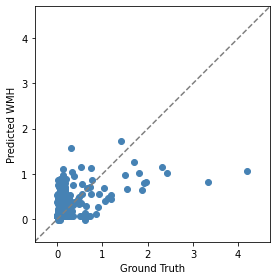

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.32	0.42	0.31		0.49		0.44



In [32]:
print("VNet-1")
normalization = 'groupnorm'
blocknum = 1
out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc])
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/230504_ieie_vnet-{}'.format(blocknum)))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

VNet-1


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.10it/s]


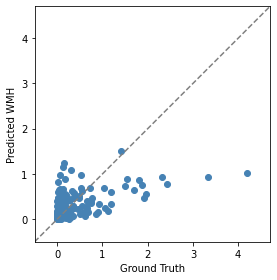

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.29	0.38	0.23		0.52		0.46



In [33]:
print("VNet-1")
normalization = 'groupnorm'
blocknum = 1
out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc])
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/230505_ieie_vnet-{}'.format(blocknum)))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

VNet-2


100%|███████████████████████████████████████████| 49/49 [00:36<00:00,  1.33it/s]


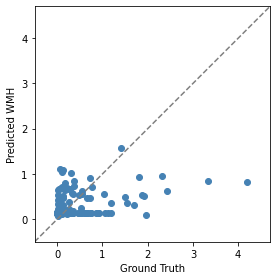

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.29	0.40	0.19		0.41		0.35



In [54]:
print("VNet-2")
normalization = 'groupnorm'
blocknum = 2
out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc])
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/230505_ieie_vnet-{}'.format(blocknum)))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

VNet-3


100%|███████████████████████████████████████████| 49/49 [00:32<00:00,  1.53it/s]


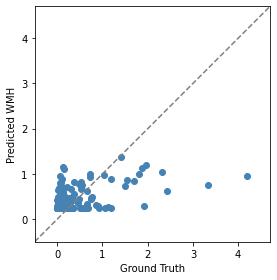

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.33	0.41	0.21		0.51		0.40



In [55]:
print("VNet-3")
normalization = 'groupnorm'
blocknum = 3
out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc])
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/230505_ieie_vnet-{}'.format(blocknum)))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

VNet-4


100%|███████████████████████████████████████████| 49/49 [00:30<00:00,  1.61it/s]


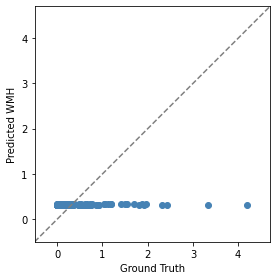

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.35	0.44	0.00		0.18		0.12



In [56]:
print("VNet-4")
normalization = 'groupnorm'
blocknum = 4
out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc])
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/230505_ieie_vnet-{}'.format(blocknum)))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

VNet-1


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.08it/s]


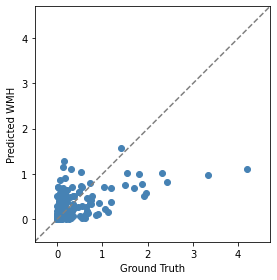

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.30	0.40	0.26		0.52		0.43



In [34]:
print("VNet-1")
normalization = 'groupnorm'
blocknum = 1
out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc])
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/230430_ieie_vnet-{}'.format(blocknum)))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

VNet-2


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.07it/s]


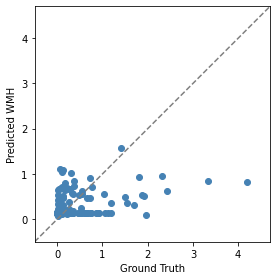

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.29	0.40	0.19		0.41		0.35



In [35]:
print("VNet-2")
blocknum = 2
out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc], dropout_p=dropout_rate)
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/230430_ieie_vnet-{}'.format(blocknum)))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

VNet-3


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.10it/s]


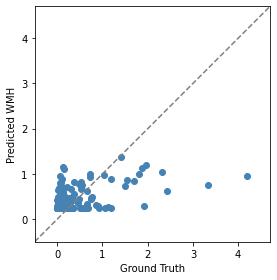

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.33	0.41	0.21		0.51		0.40



In [36]:
print("VNet-3")
blocknum = 3
out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc], dropout_p=dropout_rate)
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/230430_ieie_vnet-{}'.format(blocknum)))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

VNet-4


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.08it/s]


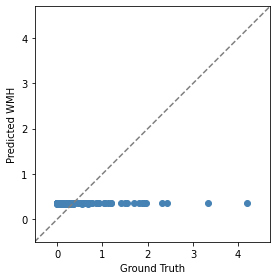

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.36	0.45	0.00		0.28		0.23



In [37]:
print("VNet-4")
blocknum = 4
out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc], dropout_p=dropout_rate)
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/230430_ieie_vnet-{}'.format(blocknum)))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

SE-SFCN


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.08it/s]


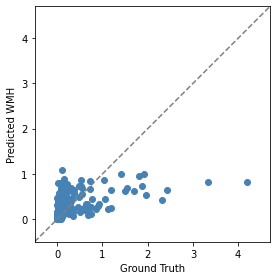

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.30	0.40	0.19		0.47		0.55



In [38]:
print("SE-SFCN")
def forward(self, x):
    x = self.feature_extractor(x)
    # add SEBlock
    x = self.seblock(x)*x
    x = self.classifier(x)
    x = x.view(x.size(0), -1)
    x = self.fc(x)
    return x

net = SFCN()
net.seblock = SEBlock(64)
net.fc = nn.Sequential(
    nn.Linear(384, 1),
    nn.LeakyReLU(),
)
net.forward = types.MethodType(forward, net)
net.load_state_dict(torch.load('pretrained/230430_ieie_se-sfcn'))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

SFCN


100%|███████████████████████████████████████████| 49/49 [00:44<00:00,  1.10it/s]


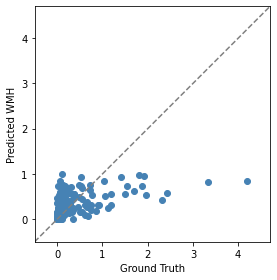

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.29	0.39	0.19		0.50		0.57



In [39]:
print("SFCN")
net = SFCN()
net.fc = nn.Sequential(
    nn.Linear(384, 1),
    nn.LeakyReLU(),
)
net.load_state_dict(torch.load('pretrained/230430_ieie_sfcn'))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

Resnet10


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.08it/s]


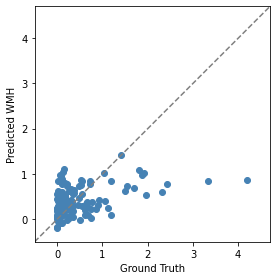

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.31	0.41	0.25		0.46		0.49



In [40]:
print("Resnet10")
net = resnet(model_depth=10, in_channels=1, num_classes=1)
net.load_state_dict(torch.load('pretrained/230430_ieie_resnet10'))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

Resnet18


100%|███████████████████████████████████████████| 49/49 [00:45<00:00,  1.07it/s]


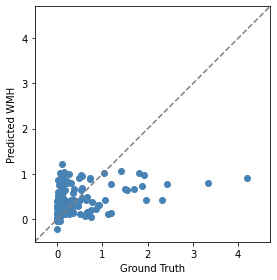

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.33	0.43	0.22		0.40		0.43



In [42]:
print("Resnet18")
net = resnet(model_depth=18, in_channels=1, num_classes=1)
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/230430_ieie_resnet18'))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

Resnet26


100%|███████████████████████████████████████████| 49/49 [00:47<00:00,  1.04it/s]


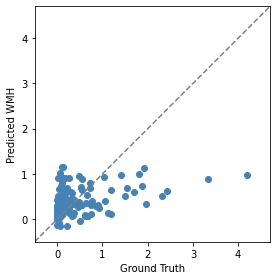

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.33	0.43	0.21		0.41		0.44



In [43]:
print("Resnet26")
net = resnet26(in_channels=1, num_classes=1)
net.load_state_dict(torch.load('pretrained/230430_ieie_resnet26'))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

Inception-Resnet-v2


100%|███████████████████████████████████████████| 49/49 [00:46<00:00,  1.06it/s]


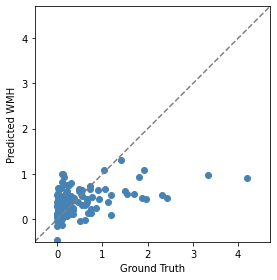

------------------------------------------------------------------------------------------
MAE	RMSE	R-Squared	Pearson's r	Spearman's r	
0.30	0.39	0.22		0.48		0.52



In [44]:
print("Inception-Resnet-v2")
net = inception_resnet_v2(in_channels=1, num_classes=1)
net.load_state_dict(torch.load('pretrained/230430_ieie_inception-resnet-v2'))
net.cuda()
mae, rmse, r2, pearson, spearman = predict(net, test_loader)
text = "------------------------------------------------------------------------------------------\n"
text += "MAE\tRMSE\tR-Squared\tPearson's r\tSpearman's r\t\n"
text += "==========================================================================================\n"
text += "{:.2f}\t{:.2f}\t{:.2f}\t\t{:.2f}\t\t{:.2f}\n".format(mae, rmse, r2, pearson, spearman)
print(text)

In [59]:
from medcam import medcam
from copy import deepcopy

print("VNet-1")
normalization = 'groupnorm'
blocknum = 1
out_size = 2 ** blocknum
out_size = 192 // out_size
num_fc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc])
net = torch.nn.DataParallel(net, device_ids=[0, 1])
net.load_state_dict(torch.load('pretrained/230505_ieie_vnet-{}'.format(blocknum)))
net.cuda()

gradcam_model = deepcopy(net)

model = medcam.inject(gradcam_model, output_dir="feature_maps_20230517", save_maps=True)

VNet-1


In [63]:
gradcam_loader = DataLoader(test_set, batch_size=1, num_workers=16)

In [64]:
criterion = nn.L1Loss()

with torch.no_grad():
    for i, (inputs, labels, _) in enumerate(gradcam_loader):
        inputs, labels = inputs.to(device, dtype=torch.float), labels.to(device, dtype=torch.float)
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        print(f"[{i}]:", outputs.shape)
        print("Step [{} / {}], Loss: {:4f}\n".format(i+1, len(gradcam_loader), loss.item()))

[0]: torch.Size([1, 1])
Step [1 / 195], Loss: 0.130339

[1]: torch.Size([1, 1])
Step [2 / 195], Loss: 0.116248

[2]: torch.Size([1, 1])
Step [3 / 195], Loss: 0.086875

[3]: torch.Size([1, 1])
Step [4 / 195], Loss: 0.161207

[4]: torch.Size([1, 1])
Step [5 / 195], Loss: 0.081045

[5]: torch.Size([1, 1])
Step [6 / 195], Loss: 0.194435

[6]: torch.Size([1, 1])
Step [7 / 195], Loss: 0.084510

[7]: torch.Size([1, 1])
Step [8 / 195], Loss: 0.277320

[8]: torch.Size([1, 1])
Step [9 / 195], Loss: 0.140131

[9]: torch.Size([1, 1])
Step [10 / 195], Loss: 0.065607

[10]: torch.Size([1, 1])
Step [11 / 195], Loss: 0.055200

[11]: torch.Size([1, 1])
Step [12 / 195], Loss: 0.329051

[12]: torch.Size([1, 1])
Step [13 / 195], Loss: 0.151791

[13]: torch.Size([1, 1])
Step [14 / 195], Loss: 0.078560

[14]: torch.Size([1, 1])
Step [15 / 195], Loss: 0.117763

[15]: torch.Size([1, 1])
Step [16 / 195], Loss: 0.138438

[16]: torch.Size([1, 1])
Step [17 / 195], Loss: 0.017207

[17]: torch.Size([1, 1])
Step [18

[138]: torch.Size([1, 1])
Step [139 / 195], Loss: 0.473984

[139]: torch.Size([1, 1])
Step [140 / 195], Loss: 0.345512

[140]: torch.Size([1, 1])
Step [141 / 195], Loss: 0.096401

[141]: torch.Size([1, 1])
Step [142 / 195], Loss: 0.372441

[142]: torch.Size([1, 1])
Step [143 / 195], Loss: 0.152722

[143]: torch.Size([1, 1])
Step [144 / 195], Loss: 0.031016

[144]: torch.Size([1, 1])
Step [145 / 195], Loss: 0.279188

[145]: torch.Size([1, 1])
Step [146 / 195], Loss: 0.595151

[146]: torch.Size([1, 1])
Step [147 / 195], Loss: 0.948391

[147]: torch.Size([1, 1])
Step [148 / 195], Loss: 0.237724

[148]: torch.Size([1, 1])
Step [149 / 195], Loss: 0.128205

[149]: torch.Size([1, 1])
Step [150 / 195], Loss: 0.134161

[150]: torch.Size([1, 1])
Step [151 / 195], Loss: 0.092165

[151]: torch.Size([1, 1])
Step [152 / 195], Loss: 0.101848

[152]: torch.Size([1, 1])
Step [153 / 195], Loss: 0.206416

[153]: torch.Size([1, 1])
Step [154 / 195], Loss: 0.173199

[154]: torch.Size([1, 1])
Step [155 / 19

In [65]:
os.listdir("./feature_maps_20230517/")

['module.feature_extractor']

In [66]:
dir_name = "./feature_maps_20230517/module.feature_extractor/"
os.listdir(dir_name)

['attention_map_110_0_0.nii.gz',
 'attention_map_15_0_0.nii.gz',
 'attention_map_8_0_0.nii.gz',
 'attention_map_166_0_0.nii.gz',
 'attention_map_52_0_0.nii.gz',
 'attention_map_75_0_0.nii.gz',
 'attention_map_179_0_0.nii.gz',
 'attention_map_135_0_0.nii.gz',
 'attention_map_87_0_0.nii.gz',
 'attention_map_159_0_0.nii.gz',
 'attention_map_149_0_0.nii.gz',
 'attention_map_49_0_0.nii.gz',
 'attention_map_189_0_0.nii.gz',
 'attention_map_134_0_0.nii.gz',
 'attention_map_65_0_0.nii.gz',
 'attention_map_40_0_0.nii.gz',
 'attention_map_170_0_0.nii.gz',
 'attention_map_122_0_0.nii.gz',
 'attention_map_107_0_0.nii.gz',
 'attention_map_150_0_0.nii.gz',
 'attention_map_114_0_0.nii.gz',
 'attention_map_24_0_0.nii.gz',
 'attention_map_36_0_0.nii.gz',
 'attention_map_90_0_0.nii.gz',
 'attention_map_119_0_0.nii.gz',
 'attention_map_0_0_0.nii.gz',
 'attention_map_172_0_0.nii.gz',
 'attention_map_161_0_0.nii.gz',
 'attention_map_152_0_0.nii.gz',
 'attention_map_175_0_0.nii.gz',
 'attention_map_14_0_0.n

In [67]:
cams = [dir_name + f'attention_map_{i}_0_0.nii.gz' for i in range(len(gradcam_loader))]
cams

['./feature_maps_20230517/module.feature_extractor/attention_map_0_0_0.nii.gz',
 './feature_maps_20230517/module.feature_extractor/attention_map_1_0_0.nii.gz',
 './feature_maps_20230517/module.feature_extractor/attention_map_2_0_0.nii.gz',
 './feature_maps_20230517/module.feature_extractor/attention_map_3_0_0.nii.gz',
 './feature_maps_20230517/module.feature_extractor/attention_map_4_0_0.nii.gz',
 './feature_maps_20230517/module.feature_extractor/attention_map_5_0_0.nii.gz',
 './feature_maps_20230517/module.feature_extractor/attention_map_6_0_0.nii.gz',
 './feature_maps_20230517/module.feature_extractor/attention_map_7_0_0.nii.gz',
 './feature_maps_20230517/module.feature_extractor/attention_map_8_0_0.nii.gz',
 './feature_maps_20230517/module.feature_extractor/attention_map_9_0_0.nii.gz',
 './feature_maps_20230517/module.feature_extractor/attention_map_10_0_0.nii.gz',
 './feature_maps_20230517/module.feature_extractor/attention_map_11_0_0.nii.gz',
 './feature_maps_20230517/module.featu

In [78]:
import nibabel as nib
import torch.nn.functional as F
from scipy.ndimage import rotate

In [81]:
from scipy.ndimage import zoom

def show_cam(inputs, file_name, img_size=192, n_slices=12):
    print(file_name)
    
    # load ground image (patient image)
    ground_img = inputs.detach().cpu().numpy().squeeze()
    print(f'ground_img.shape={ground_img.shape}')

    # get feature matrix
    heatmap = nib.load(file_name)
    heatmap = heatmap.get_fdata()
    print(f'before zoom: heatmap.shape={heatmap.shape}')

    # rescale feature matrix to ground image size
    scale1 = ground_img.shape[0] / heatmap.shape[0]
    scale2 = ground_img.shape[1] / heatmap.shape[1]
    scale3 = ground_img.shape[2] / heatmap.shape[2]
    heatmap = zoom(heatmap, zoom=(scale1, scale2, scale3))
    print(f'after zoom: heatmap.shape={heatmap.shape}')
    
    ########### 3D ###########
    # convert ndarray to tensor to get feature map image
    ground_img = torch.Tensor(ground_img.reshape(1,img_size,img_size,img_size))
    heatmap = torch.Tensor(heatmap)

    # dim=0: axial, 1: coronal, 2: sagittal
    gcam = torch.mul(ground_img, heatmap).sum(dim=0, keepdim=True)
    gcam = F.relu(gcam)
    print(gcam.shape)

    # gcam = F.interpolate(gcam, 170, mode="bilinear", align_corners=False)

    B,C,H,W = gcam.shape
    gcam = gcam.view(B, -1)
    gcam -= gcam.min(dim=1, keepdim=True)[0]
    gcam /= gcam.max(dim=1, keepdim=True)[0]
    gcam = gcam.view(B, C, H, W)
    print(gcam.shape)

    # convert tensor to ndarray to plot image
    gcam_img = gcam.detach().numpy().squeeze()
    ground_img = inputs.detach().cpu().numpy().squeeze()
    print(f'ground_img.shape={ground_img.shape} / gcam_img.shape={gcam_img.shape}')
    
    # axial view 3D - 노이즈성 feature가 어디서 나타는지 확인하기 위함.
    slices = img_size // n_slices
#     for i in range(n_slices):
#         slice_idx = slices*(i+1) - 1
#         print(slice_idx)
#         plt.figure(figsize=(11,11))

#         plt.subplot(1, 2, 1)
#         plt.imshow(ground_img[slice_idx, :, :], cmap='gray')
#         plt.axis('off')

#         plt.subplot(1, 2, 2)
#         plt.imshow(gcam_img[slice_idx, :, :], cmap='jet', alpha=1.0)
#         plt.axis('off')

#         plt.show()
#         plt.close()
       
    plt.figure(figsize=(125,125))
    plt.imshow(np.concatenate([ground_img[:, :, slices*(i+1)-1] for i in range(n_slices)], axis=1), cmap='gray')
    plt.axis('off')
    plt.show()
    
    plt.figure(figsize=(125,125))
    plt.imshow(np.concatenate([gcam_img[:, :, slices*(i+1)-1] for i in range(n_slices)], axis=1), cmap='jet', alpha=1.0)
    plt.axis('off')
    plt.show()

def show_mip(inputs, file_name, axis=1):
    print(file_name)
    
    # load ground image (patient image)
    ground_img = inputs.detach().cpu().numpy().squeeze()
    print(f'ground_img.shape={ground_img.shape}')

    # get feature matrix
    heatmap = nib.load(file_name)
    heatmap = heatmap.get_fdata()
    print(f'before zoom: heatmap.shape={heatmap.shape}')

    # rescale feature matrix to ground image size
    scale1 = ground_img.shape[0] / heatmap.shape[0]
    scale2 = ground_img.shape[1] / heatmap.shape[1]
    scale3 = ground_img.shape[2] / heatmap.shape[2]
    heatmap = zoom(heatmap, zoom=(scale1, scale2, scale3))
    print(f'after zoom: heatmap.shape={heatmap.shape}')
    
    ########### 2D ###########
    # convert ndarray to tensor to get feature map image
    ground_img = torch.Tensor(ground_img)
    heatmap = torch.Tensor(heatmap)

    # dim=0: axial, 1: coronal, 2: sagittal
    gcam = torch.mul(ground_img, heatmap).sum(dim=axis, keepdim=True)
    gcam = F.relu(gcam)
    print(gcam.shape)

    C,H,W = gcam.shape
    gcam = gcam.view(1, -1)
    gcam -= gcam.min(dim=1, keepdim=True)[0]
    gcam /= gcam.max(dim=1, keepdim=True)[0]
    gcam = gcam.view(C, H, W)
    print(gcam.shape)

    # convert tensor to ndarray to plot image
    gcam_img = gcam.detach().numpy().squeeze()
    ground_img = inputs.detach().cpu().numpy().squeeze()
    print(f'ground_img.shape={ground_img.shape} / gcam_img.shape={gcam_img.shape}')
    
    plt.figure(figsize=(16,16))
    plt.subplot(1, 2, 1)
    plt.imshow(rotate(np.max(ground_img, axis=axis), 90), cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(rotate(gcam_img, 90), cmap='jet', alpha=1.0)
    plt.axis('off')
    
    plt.show()
    plt.close()

loss: tensor(0.1303, device='cuda:0', grad_fn=<MeanBackward0>) tensor([[0.0013]], device='cuda:0')
./feature_maps_20230517/module.feature_extractor/attention_map_0_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([192, 1, 192])
torch.Size([192, 1, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192)


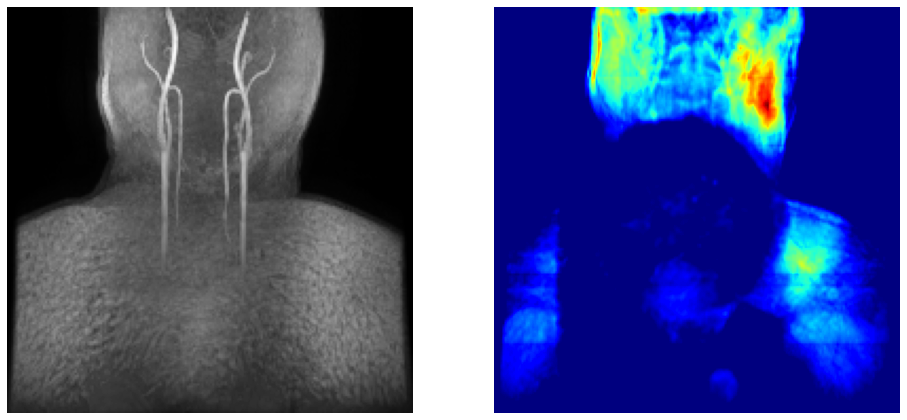

./feature_maps_20230517/module.feature_extractor/attention_map_0_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([1, 192, 192, 192])
torch.Size([1, 192, 192, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192, 192)


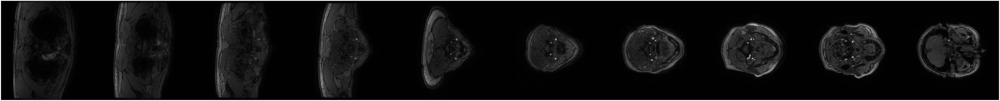

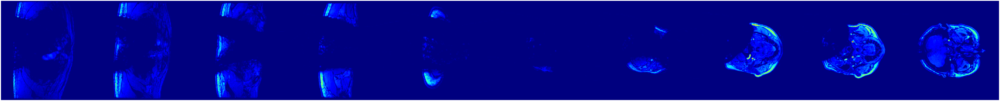

loss: tensor(0.1162, device='cuda:0', grad_fn=<MeanBackward0>) tensor([[0.0228]], device='cuda:0')
./feature_maps_20230517/module.feature_extractor/attention_map_1_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([192, 1, 192])
torch.Size([192, 1, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192)


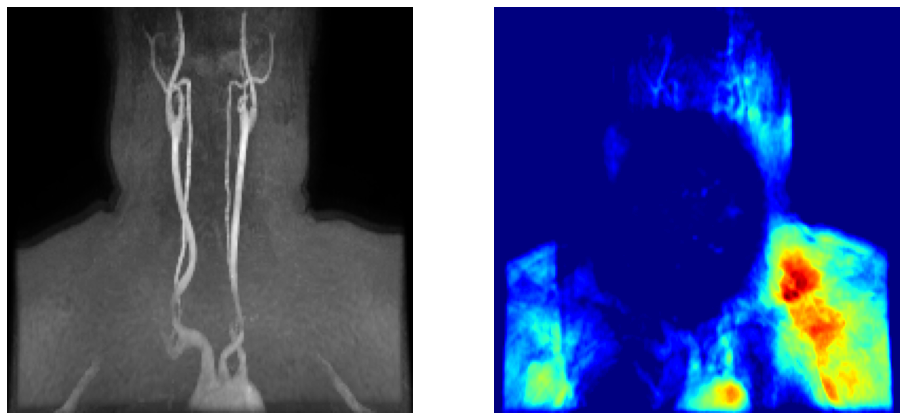

./feature_maps_20230517/module.feature_extractor/attention_map_1_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([1, 192, 192, 192])
torch.Size([1, 192, 192, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192, 192)


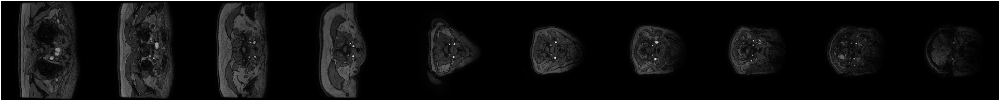

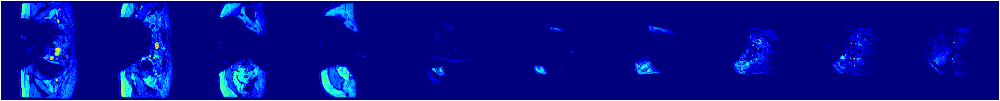

loss: tensor(0.0869, device='cuda:0', grad_fn=<MeanBackward0>) tensor([[0.0196]], device='cuda:0')
./feature_maps_20230517/module.feature_extractor/attention_map_2_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([192, 1, 192])
torch.Size([192, 1, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192)


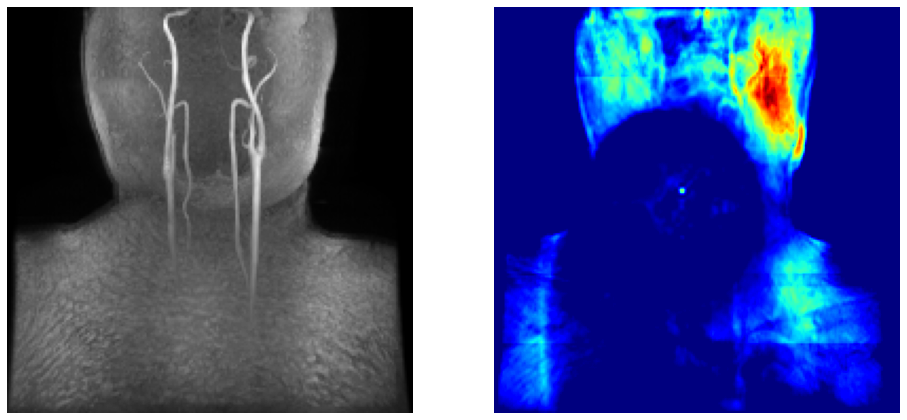

./feature_maps_20230517/module.feature_extractor/attention_map_2_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([1, 192, 192, 192])
torch.Size([1, 192, 192, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192, 192)


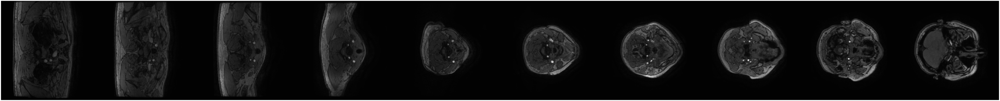

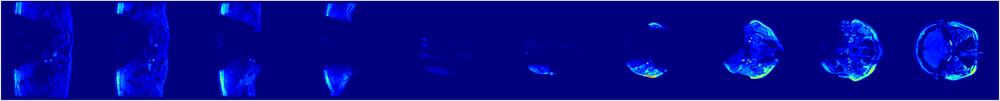

loss: tensor(0.0810, device='cuda:0', grad_fn=<MeanBackward0>) tensor([[0.0301]], device='cuda:0')
./feature_maps_20230517/module.feature_extractor/attention_map_4_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([192, 1, 192])
torch.Size([192, 1, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192)


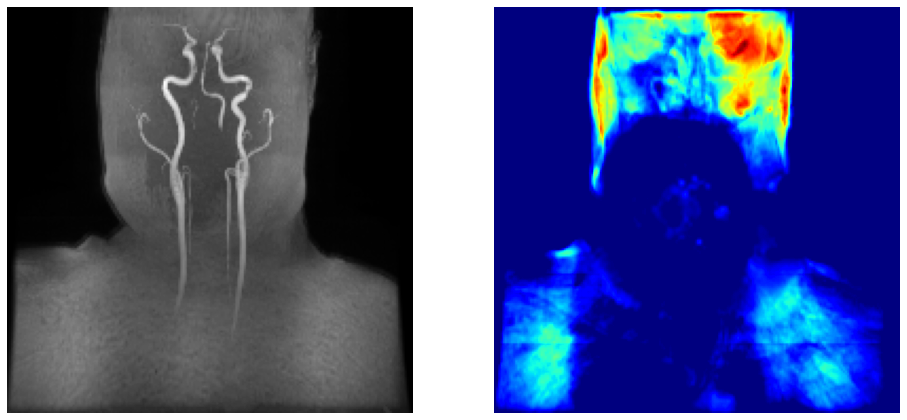

./feature_maps_20230517/module.feature_extractor/attention_map_4_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([1, 192, 192, 192])
torch.Size([1, 192, 192, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192, 192)


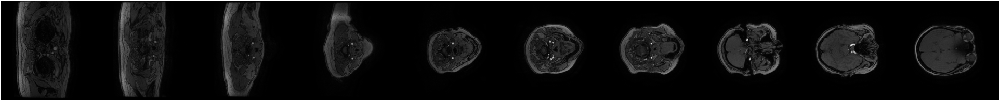

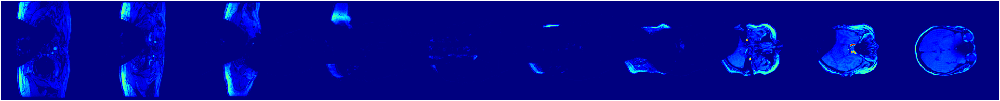

loss: tensor(0.0656, device='cuda:0', grad_fn=<MeanBackward0>) tensor([[0.1902]], device='cuda:0')
./feature_maps_20230517/module.feature_extractor/attention_map_9_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([192, 1, 192])
torch.Size([192, 1, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192)


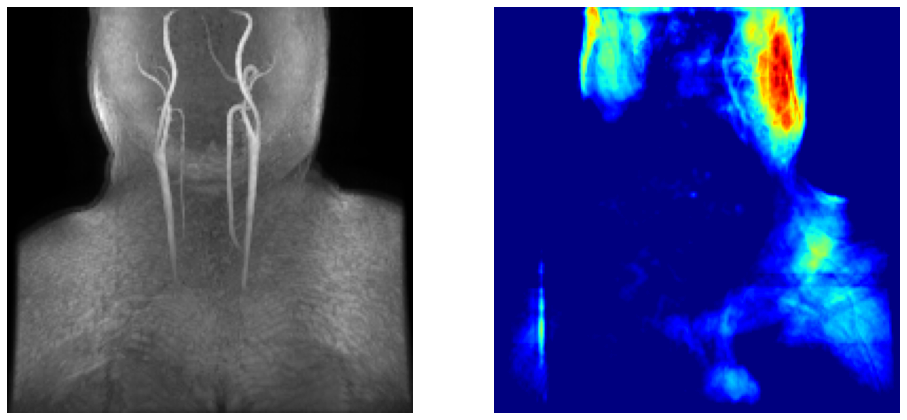

./feature_maps_20230517/module.feature_extractor/attention_map_9_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([1, 192, 192, 192])
torch.Size([1, 192, 192, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192, 192)


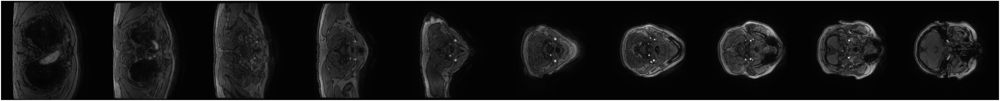

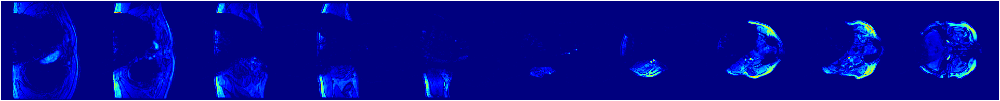

loss: tensor(0.0552, device='cuda:0', grad_fn=<MeanBackward0>) tensor([[0.0253]], device='cuda:0')
./feature_maps_20230517/module.feature_extractor/attention_map_10_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([192, 1, 192])
torch.Size([192, 1, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192)


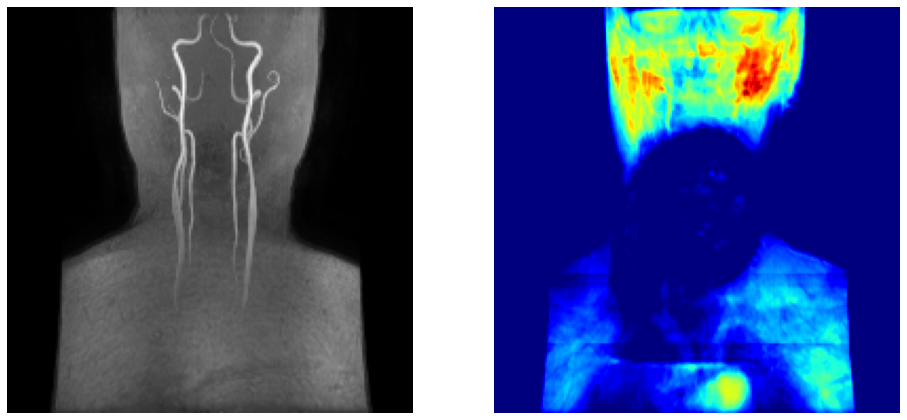

./feature_maps_20230517/module.feature_extractor/attention_map_10_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([1, 192, 192, 192])
torch.Size([1, 192, 192, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192, 192)


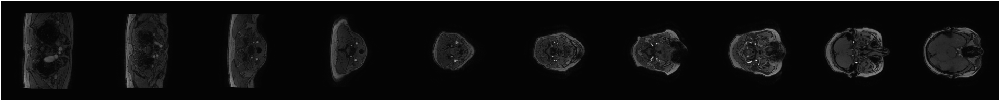

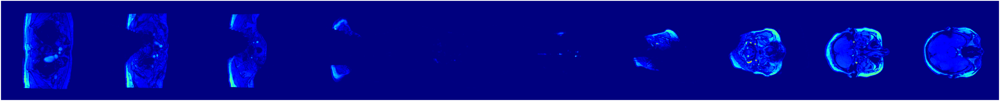

loss: tensor(0.0172, device='cuda:0', grad_fn=<MeanBackward0>) tensor([[0.1035]], device='cuda:0')
./feature_maps_20230517/module.feature_extractor/attention_map_16_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([192, 1, 192])
torch.Size([192, 1, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192)


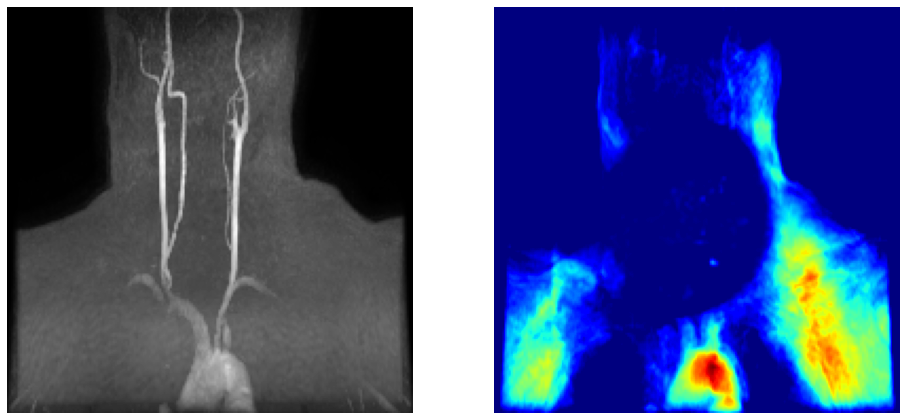

./feature_maps_20230517/module.feature_extractor/attention_map_16_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([1, 192, 192, 192])
torch.Size([1, 192, 192, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192, 192)


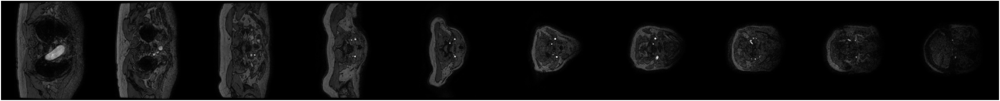

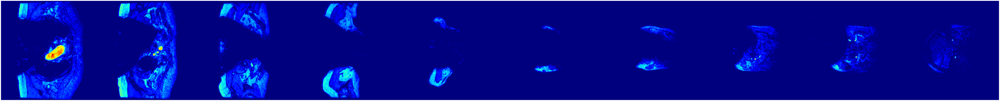

loss: tensor(0.0094, device='cuda:0', grad_fn=<MeanBackward0>) tensor([[0.1771]], device='cuda:0')
./feature_maps_20230517/module.feature_extractor/attention_map_53_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([192, 1, 192])
torch.Size([192, 1, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192)


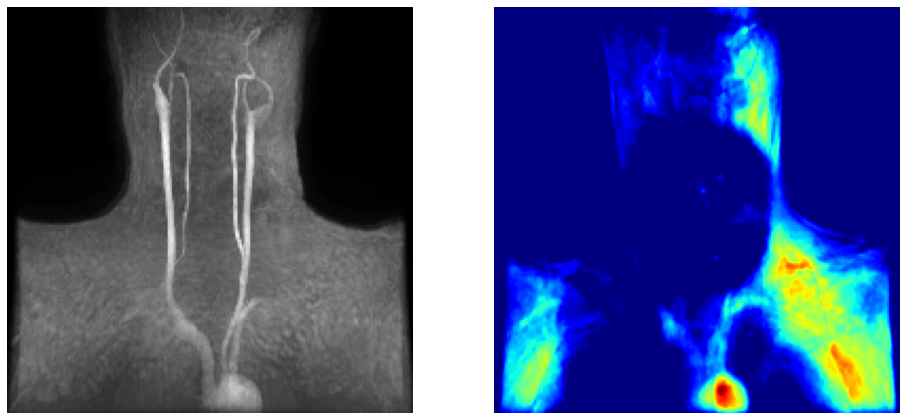

./feature_maps_20230517/module.feature_extractor/attention_map_53_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([1, 192, 192, 192])
torch.Size([1, 192, 192, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192, 192)


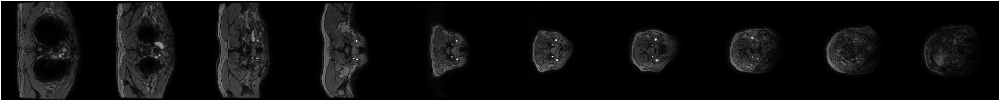

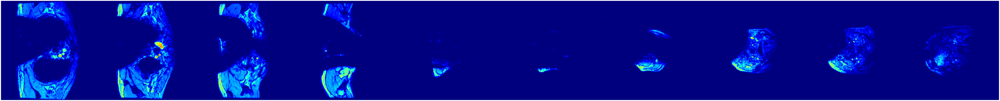

loss: tensor(0.0040, device='cuda:0', grad_fn=<MeanBackward0>) tensor([[0.0905]], device='cuda:0')
./feature_maps_20230517/module.feature_extractor/attention_map_65_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([192, 1, 192])
torch.Size([192, 1, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192)


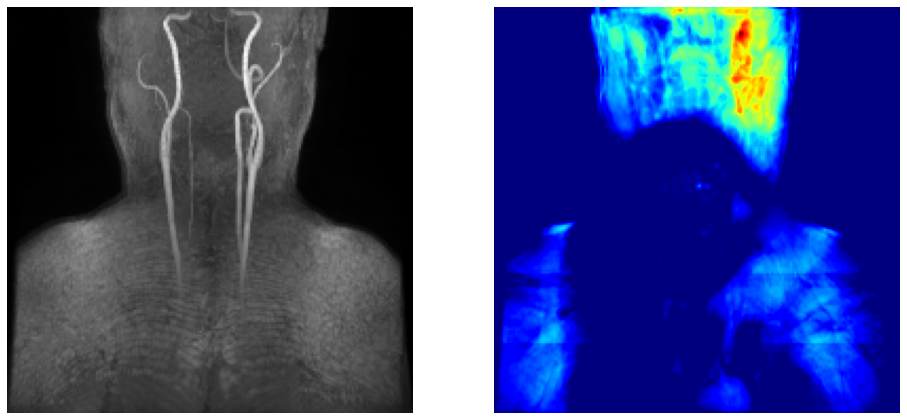

./feature_maps_20230517/module.feature_extractor/attention_map_65_0_0.nii.gz
ground_img.shape=(192, 192, 192)
before zoom: heatmap.shape=(96, 96, 96)
after zoom: heatmap.shape=(192, 192, 192)
torch.Size([1, 192, 192, 192])
torch.Size([1, 192, 192, 192])
ground_img.shape=(192, 192, 192) / gcam_img.shape=(192, 192, 192)


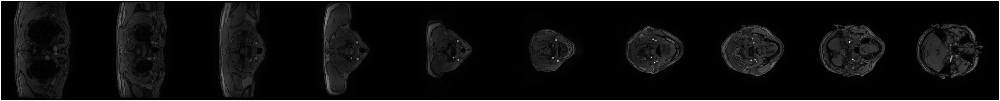

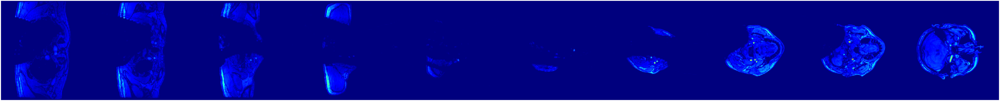

In [86]:
criterion = nn.L1Loss()

min_loss = 1.0

for i, (inputs, labels, _) in enumerate(gradcam_loader):
    inputs, labels = inputs.to(device, dtype=torch.float), labels.to(device, dtype=torch.float)
    outputs = model(inputs)
    loss = criterion(outputs, labels)
    if min_loss > loss:
        min_loss = loss
        print('loss:', loss, end=' ')
        print(labels)
        show_mip(inputs, cams[i])
        show_cam(inputs, cams[i], n_slices=10)

In [88]:
from models.segmentation import *

normalization = 'groupnorm'
blocknum = 1
net = VNet_New(n_channels=1, n_classes=2, n_filters=16, n_blocks=blocknum, normalization=normalization)  # num classes: 2 (background, label)
net

VNet_New(
  (encoder): Sequential(
    (block_1): ResidualConvBlock(
      (conv): Sequential(
        (0): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
        (1): GroupNorm3D()
        (2): ReLU(inplace=True)
      )
    )
    (block_1_dw): DownsamplingConvBlock(
      (conv): Sequential(
        (0): Conv3d(16, 32, kernel_size=(2, 2, 2), stride=(2, 2, 2))
        (1): GroupNorm3D()
        (2): ReLU(inplace=True)
      )
    )
  )
  (decoder): Sequential(
    (block_2): ResidualConvBlock(
      (conv): Sequential(
        (0): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
        (1): GroupNorm3D()
        (2): ReLU(inplace=True)
      )
    )
    (block_2_up): UpsamplingDeconvBlock(
      (conv): Sequential(
        (0): ConvTranspose3d(32, 16, kernel_size=(2, 2, 2), stride=(2, 2, 2))
        (1): GroupNorm3D()
        (2): ReLU(inplace=True)
      )
    )
    (block_3): ResidualConvBlock(
      (conv): Sequential(
        

In [89]:
from models.segmentation import *

normalization = 'groupnorm'
blocknum = 4
net = VNet_New(n_channels=1, n_classes=2, n_filters=16, n_blocks=blocknum, normalization=normalization)  # num classes: 2 (background, label)
net

VNet_New(
  (encoder): Sequential(
    (block_1): ResidualConvBlock(
      (conv): Sequential(
        (0): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
        (1): GroupNorm3D()
        (2): ReLU(inplace=True)
      )
    )
    (block_1_dw): DownsamplingConvBlock(
      (conv): Sequential(
        (0): Conv3d(16, 32, kernel_size=(2, 2, 2), stride=(2, 2, 2))
        (1): GroupNorm3D()
        (2): ReLU(inplace=True)
      )
    )
    (block_2): ResidualConvBlock(
      (conv): Sequential(
        (0): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
        (1): GroupNorm3D()
        (2): ReLU(inplace=True)
        (3): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
        (4): GroupNorm3D()
        (5): ReLU(inplace=True)
      )
    )
    (block_2_dw): DownsamplingConvBlock(
      (conv): Sequential(
        (0): Conv3d(32, 64, kernel_size=(2, 2, 2), stride=(2, 2, 2))
        (1): GroupNorm3D()
     

In [90]:
from torchsummary import summary

In [92]:
net.cuda()
summary(net, input_size=(1,192,192,192))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv3d-1    [-1, 16, 192, 192, 192]             448
       GroupNorm3D-2    [-1, 16, 192, 192, 192]              32
              ReLU-3    [-1, 16, 192, 192, 192]               0
 ResidualConvBlock-4    [-1, 16, 192, 192, 192]               0
            Conv3d-5       [-1, 32, 96, 96, 96]           4,128
       GroupNorm3D-6       [-1, 32, 96, 96, 96]              64
              ReLU-7       [-1, 32, 96, 96, 96]               0
DownsamplingConvBlock-8       [-1, 32, 96, 96, 96]               0
            Conv3d-9       [-1, 32, 96, 96, 96]          27,680
      GroupNorm3D-10       [-1, 32, 96, 96, 96]              64
             ReLU-11       [-1, 32, 96, 96, 96]               0
           Conv3d-12       [-1, 32, 96, 96, 96]          27,680
      GroupNorm3D-13       [-1, 32, 96, 96, 96]              64
             ReLU-14       [-1, 32, 

In [93]:
print("VNet-1")
normalization = 'groupnorm'
blocknum = 1
out_size = 2 ** blocknum
out_size = 192 // out_size
numfc = [out_size * out_size * out_size,30,16,4]
net = Regressor(n_channels=1, n_classes=2, out_features=1, normalization=normalization, n_blocks=blocknum,
                fc_features=[*num_fc])
net

VNet-1


Regressor(
  (encoder): Sequential(
    (block_1): ResidualConvBlock(
      (conv): Sequential(
        (0): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
        (1): GroupNorm3D()
        (2): ReLU(inplace=True)
      )
    )
    (block_1_dw): DownsamplingConvBlock(
      (conv): Sequential(
        (0): Conv3d(16, 32, kernel_size=(2, 2, 2), stride=(2, 2, 2))
        (1): GroupNorm3D()
        (2): ReLU(inplace=True)
      )
    )
  )
  (decoder): Sequential(
    (block_2): ResidualConvBlock(
      (conv): Sequential(
        (0): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
        (1): GroupNorm3D()
        (2): ReLU(inplace=True)
      )
    )
    (block_2_up): UpsamplingDeconvBlock(
      (conv): Sequential(
        (0): ConvTranspose3d(32, 16, kernel_size=(2, 2, 2), stride=(2, 2, 2))
        (1): GroupNorm3D()
        (2): ReLU(inplace=True)
      )
    )
    (block_3): ResidualConvBlock(
      (conv): Sequential(
       